# Preparing working environnment

In [1]:
# Import librairies
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Allowing modules autoreload
%load_ext autoreload
%autoreload 2
%matplotlib inline

# Pandas options
pd.options.display.max_columns = 100

In [2]:
# Import des données
data = pd.read_pickle('customer_aggregated_data.pkl')

In [263]:
data.shape

(96089, 73)

# Preprocessing Data

In [11]:
# Scaling data
from sklearn import preprocessing
data.sort_values(by = 'order_purchase_timestamp', inplace = True)
std_scale = preprocessing.StandardScaler().fit(data.drop(columns = 'order_purchase_timestamp'))
data_scaled = std_scale.transform(data.drop(columns = 'order_purchase_timestamp'))

# Kmeans

## Choosing number of clusters

In [18]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [5]:
# Training with K-means for 2 to 10 clusters
inertias = []
silhouettes = []

for n_clts in range(2,11):
    print('Training with {} clusters'.format(n_clts))
    # Training
    kmeans = KMeans(n_clusters = n_clts)
    kmeans.fit(data_scaled)
    
    # Scores
    inertias.append(kmeans.inertia_)
    sil = silhouette_score(data_scaled, kmeans.labels_)
    silhouettes.append(sil)

Training with 2 clusters
Training with 3 clusters
Training with 4 clusters
Training with 5 clusters
Training with 6 clusters
Training with 7 clusters
Training with 8 clusters
Training with 9 clusters
Training with 10 clusters


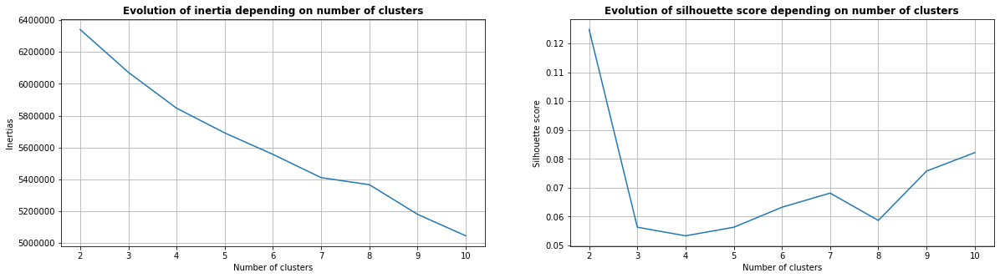

In [6]:
# Visualisation of inertia depending on the number of clusters
plt.figure(figsize = (20,5))
plt.subplot(121)
plt.plot(range(2,11), inertias)

plt.title('Evolution of inertia depending on number of clusters',fontweight = 'bold')
plt.xlabel('Number of clusters')
plt.ylabel('Inertias')
plt.grid(True)

plt.subplot(122)
plt.plot(range(2,11), silhouettes)

plt.title('Evolution of silhouette score depending on number of clusters',fontweight = 'bold')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.grid(True)

plt.show()

## 5 clusters Kmeans

### Training

In [5]:
# Training
kmeans = KMeans(n_clusters = 5)
kmeans.fit(data_scaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

In [6]:
# Convergence
kmeans.n_iter_

20

In [7]:
df_clusters = data.copy()
df_clusters['cluster_5_means'] = kmeans.labels_

In [ ]:
# Storing results
df_clusters.to_pickle('clustered_data.pkl')

### Visualization with PCA

In [ ]:
# Load results
df_clusters = pd.read_pickle('clustered_data.pkl')

In [4]:
# PCA dimension reduction
from sklearn import decomposition
pca = decomposition.PCA(n_components = 2)
pca.fit(data_scaled)
data_trans = pca.transform(data_scaled)

In [9]:
centroids_trans = pca.transform(kmeans.cluster_centers_)

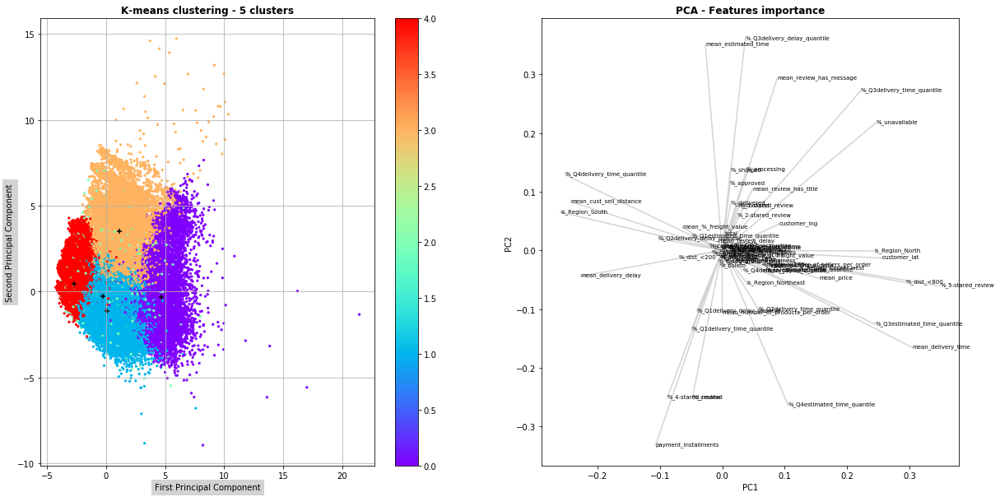

In [10]:
# Visualisation
plt.figure(figsize = (20,10))

plt.subplot(121)
# Customers
plt.scatter(
    data_trans[:,0], data_trans[:,1],
    c = kmeans.labels_, cmap = 'rainbow',
    s= 5
    )
plt.colorbar()

# Centroids
plt.scatter(
    centroids_trans[:,0], centroids_trans[:,1], 
    marker = '+', color = 'black')

plt.xlabel('First Principal Component', backgroundcolor = 'lightgrey')
plt.ylabel('Second Principal Component', backgroundcolor = 'lightgrey')
plt.title('K-means clustering - 5 clusters', fontweight = 'bold')
plt.grid(True)

plt.subplot(122)
pcs = pca.components_
for i, (x,y) in enumerate(zip(pcs[0,:], pcs[1,:])):
    plt.plot([0,x], [0,y], color = 'lightgrey')
    plt.text(x,y, data.columns[i], fontsize = 7)
    
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA - Features importance', fontweight = 'bold')

plt.show()

In [11]:
# Explained variance
pca.explained_variance_ratio_

array([0.08525489, 0.0591228 ])

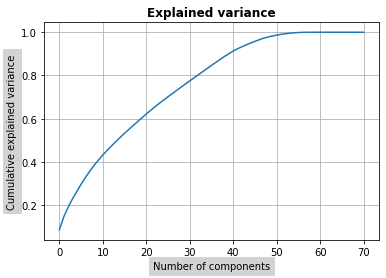

In [5]:
# PCA with multiple components
pca = decomposition.PCA(n_components = data_scaled.shape[1])
pca.fit(data_scaled)
data_trans = pca.transform(data_scaled)

# Explained variance
plt.plot(pca.explained_variance_ratio_.cumsum())

plt.title('Explained variance', fontweight = 'bold')
plt.xlabel('Number of components', backgroundcolor = 'lightgrey')
plt.ylabel('Cumulative explained variance', backgroundcolor = 'lightgrey')

plt.grid(True)
plt.show()

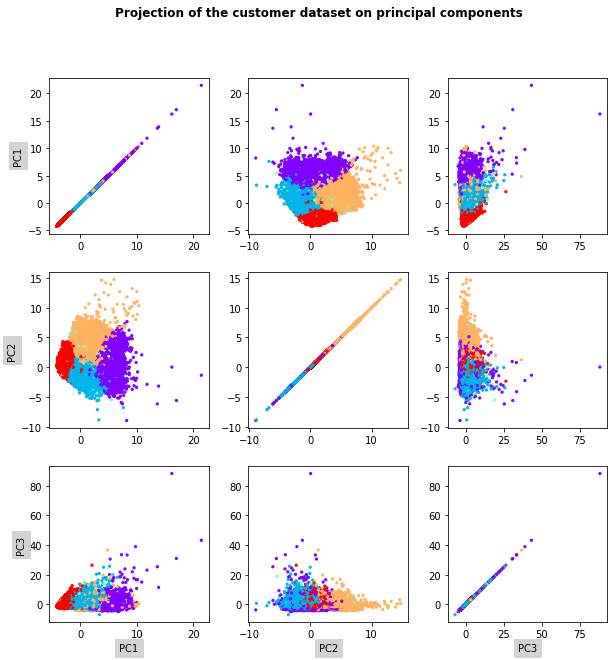

In [13]:
# Projections on the first 3 principal components
plt.figure(figsize = (10,10))
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.suptitle('Projection of the customer dataset on principal components',
            fontweight = 'bold')

for i in range(3):
    for j in range(3):
        plt.subplot(3,3,3*i+j+1)
        plt.scatter(
            data_trans[:,j], data_trans[:,i],
            c = kmeans.labels_, cmap = 'rainbow',
            s= 5
        )
        if i == 2:
            plt.xlabel('PC{}'.format(j+1), backgroundcolor = 'lightgrey')
        
        if j == 0:
            plt.ylabel('PC{}'.format(i+1), backgroundcolor = 'lightgrey')
        
plt.show()

### Performances

In [ ]:
# Davies-Bouldin
from sklearn.metrics import davies_bouldin_score
davies_bouldin_score(data_scaled, kmeans.labels_)

In [ ]:
# General silhouette score
silhouette_score(data_scaled, kmeans.labels_)

In [14]:
# Cluster silhouette scores
from sklearn.metrics import silhouette_samples
sample_silhouette_values = silhouette_samples(data_scaled, kmeans.labels_)

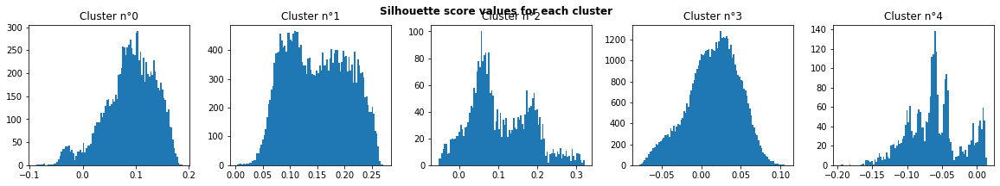

In [15]:
# Silhouette score values for each cluster
plt.figure(figsize = (20,3))
plt.suptitle('Silhouette score values for each cluster', fontweight = 'bold')
plt.subplots_adjust(wspace=0.25)

for i in range(5):
    plt.subplot(1,5,i+1)
    ith_cluster_silhouette_values = sample_silhouette_values[kmeans.labels_ == i]
    plt.hist(ith_cluster_silhouette_values, bins = 100, cumulative = False)
    plt.title('Cluster n°{}'.format(i))
    
plt.show()

### Clusters description

In [16]:
# Centroids descriptions
centroids = std_scale.inverse_transform(kmeans.cluster_centers_)
pd.DataFrame(centroids, columns = data.drop(columns = 'order_purchase_timestamp').columns)

,nb_of_orders,customer_lat,customer_lng,%_approved,%_canceled,%_created,%_delivered,%_invoiced,%_processing,%_shipped,%_unavailable,mean_delivery_time,mean_estimated_time,mean_delivery_delay,%_Q1delivery_time_quantile,%_Q2delivery_time_quantile,%_Q3delivery_time_quantile,%_Q4delivery_time_quantile,%_Q1estimated_time_quantile,%_Q2estimated_time_quantile,%_Q3estimated_time_quantile,%_Q4estimated_time_quantile,%_Q1delivery_delay_quantile,%_Q2delivery_delay_quantile,%_Q3delivery_delay_quantile,%_Q4delivery_delay_quantile,mean_number_of_products_per_order,mean_number_of_sellers_per_order,mean_price,mean_freight_value,mean_payment_value,mean_%_freight_value,%_price<60,%_price<100,%_price<180,%_price>180,total,%_boleto,%_credit_card,%_debit_card,%_not_defined,%_voucher,payment_installments,mean_review_score,mean_review_delay,mean_review_has_title,mean_review_has_message,%_1-stared_review,%_2-stared_review,%_3-stared_review,%_4-stared_review,%_5-stared_review,mean_cust_sell_distance,%_dist_<200,%_dist_<500,%_dist_<800,%_dist_>800,mean_purchase_delta,is_Region_Center-west,is_Region_North,is_Region_Northeast,is_Region_South,is_Region_Southeast,%_categ_group_auto,%_categ_group_business,%_categ_group_clothes,%_categ_group_construction,%_categ_group_consumables,%_categ_group_home,%_categ_group_leisure,%_categ_group_tech
0,1.007482,-8.425304,-41.273702,3.266159e-18,9.470594e-05,6.884684e-18,0.999558,4.735297e-05,1.877838e-16,2.999021e-04,-8.378714e-16,20.644375,31.686048,-11.629011,1.865707e-02,0.119669,0.258678,0.602996,0.013732,0.112321,0.231903,0.642043,0.356497,2.275038e-01,0.161939,0.254060,1.208779,1.009897,194.414056,40.938398,291.335662,0.271504,0.307273,0.193579,0.236481,0.262667,1.007482,0.191387,0.760037,0.014521,0.0,0.034055,3.465006,3.922791,2.793399,0.137750,0.488162,0.139825,0.039634,0.093869,0.211242,0.515429,1863.695777,0.004709,0.007927,0.012806,0.974558,4.394356e-02,0.016195,1.610001e-01,0.806042,0.002368,0.014395,0.049152,0.052688,0.262072,0.018436,0.005493,0.241435,0.168171,0.190475
1,1.000000,-23.041010,-46.591446,-1.169922e-17,1.363493e-15,-1.834335e-17,1.000000,-3.504141e-16,8.053454e-16,3.379241e-15,2.893519e-15,6.453859,14.273320,-8.426509,6.336244e-01,0.230484,0.089608,0.046284,0.880073,0.097178,0.020612,0.002136,0.059963,2.126822e-01,0.424877,0.302477,1.157853,1.007795,115.324897,15.583033,153.458119,0.176044,0.454971,0.206011,0.196792,0.142225,1.000000,0.187872,0.760856,0.022824,0.0,0.028448,2.486602,4.306150,2.255725,0.157703,0.384514,0.071562,0.025391,0.070982,0.189465,0.642600,164.662703,0.723924,0.209287,0.048105,0.018684,-1.407763e-12,0.010006,-1.170591e-14,0.002773,0.037814,0.949406,0.047330,0.044399,0.223640,0.025501,0.017015,0.316437,0.172347,0.139089
2,2.116753,-21.956024,-46.430152,1.484002e-18,1.250021e-02,1.727116e-04,0.968821,2.615347e-03,1.963977e-03,8.943750e-03,4.982898e-03,11.572015,23.622161,-12.618886,2.652765e-01,0.265129,0.222286,0.247309,0.261785,0.277191,0.230073,0.230952,0.270287,2.834319e-01,0.236167,0.210114,1.356501,1.009951,137.437659,25.097500,222.557121,0.206902,0.371272,0.216764,0.217568,0.194397,2.116753,0.184149,0.755761,0.013335,0.0,0.046755,3.279934,4.125085,2.464888,0.108547,0.417765,0.114149,0.031626,0.080327,0.171394,0.602505,517.049948,0.268798,0.339749,0.192183,0.199270,8.213909e+01,0.060449,1.174439e-02,0.056995,0.142314,0.728497,0.027904,0.032864,0.205748,0.024815,0.013006,0.436410,0.185498,0.149415
3,1.000000,-22.753239,-46.943908,1.058791e-17,7.147061e-16,-4.883653e-17,1.000000,2.136312e-15,2.521854e-15,-1.771153e-15,-3.604755e-15,13.265456,26.243780,-13.570021,1.374399e-01,0.319923,0.274992,0.267645,0.015484,0.385241,0.328886,0.270389,0.350327,3.205427e-01,0.170062,0.159069,1.198211,1.016518,148.802110,24.632361,213.004020,0.205739,0.337831,0.209035,0.247238,0.205897,1.000000,0.207156,0.752007,0.012083,0.0,0.028755,3.000470,4.099087,2.715386,0.094201,0.407518,0.107599,0.032340,0.087070,0.199357,0.573634,575.684279,0.071199,0.427391,0.275884,0.225527,1.012967e-12,0.090

In [17]:
# Mean characteristics per clusters
df_clusters.groupby(by = 'cluster_5_means').mean()

,nb_of_orders,customer_lat,customer_lng,%_approved,%_canceled,%_created,%_delivered,%_invoiced,%_processing,%_shipped,%_unavailable,mean_delivery_time,mean_estimated_time,mean_delivery_delay,%_Q1delivery_time_quantile,%_Q2delivery_time_quantile,%_Q3delivery_time_quantile,%_Q4delivery_time_quantile,%_Q1estimated_time_quantile,%_Q2estimated_time_quantile,%_Q3estimated_time_quantile,%_Q4estimated_time_quantile,%_Q1delivery_delay_quantile,%_Q2delivery_delay_quantile,%_Q3delivery_delay_quantile,%_Q4delivery_delay_quantile,mean_number_of_products_per_order,mean_number_of_sellers_per_order,mean_price,mean_freight_value,mean_payment_value,mean_%_freight_value,%_price<60,%_price<100,%_price<180,%_price>180,total,%_boleto,%_credit_card,%_debit_card,%_not_defined,%_voucher,payment_installments,mean_review_score,mean_review_delay,mean_review_has_title,mean_review_has_message,%_1-stared_review,%_2-stared_review,%_3-stared_review,%_4-stared_review,%_5-stared_review,mean_cust_sell_distance,%_dist_<200,%_dist_<500,%_dist_<800,%_dist_>800,mean_purchase_delta,is_Region_Center-west,is_Region_North,is_Region_Northeast,is_Region_South,is_Region_Southeast,%_categ_group_auto,%_categ_group_business,%_categ_group_clothes,%_categ_group_construction,%_categ_group_consumables,%_categ_group_home,%_categ_group_leisure,%_categ_group_tech
cluster_5_means,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1.007481,-8.427815,-41.274747,0.000000,0.000095,0.000000,0.999558,0.000047,0.000000,0.000300,0.000000,20.648007,31.686267,-11.625732,0.018561,0.119658,0.258653,0.603129,0.013731,0.112311,0.231881,0.642077,0.356368,0.227482,0.161924,0.254225,1.209044,1.009896,194.412868,40.945379,291.443813,0.271527,0.307339,0.193466,0.236458,0.262737,1.007481,0.191464,0.759965,0.014520,0.0,0.034052,3.464205,3.922135,2.793513,0.137831,0.488210,0.140002,0.039631,0.093860,0.211222,0.515286,1863.802832,0.004709,0.007831,0.012805,0.974655,0.043939,0.016193,0.160985,0.805871,0.002367,0.014583,0.049148,0.052683,0.262142,0.018434,0.005492,0.241507,0.168155,0.190362
1,1.000000,-23.040982,-46.592309,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,6.459452,14.258930,-8.406895,0.633724,0.230227,0.089599,0.046451,0.881772,0.095978,0.020299,0.001951,0.059470,0.212067,0.425221,0.303242,1.157887,1.007804,115.438744,15.589836,153.597300,0.176012,0.454750,0.205951,0.196833,0.142466,1.000000,0.187828,0.760856,0.022850,0.0,0.028466,2.486530,4.305380,2.255834,0.157812,0.384549,0.071758,0.025458,0.070876,0.189460,0.642447,165.048093,0.722928,0.209981,0.048198,0.018893,0.000000,0.010131,0.000000,0.002777,0.038008,0.949084,0.047385,0.044300,0.223525,0.025530,0.017072,0.316542,0.172360,0.139101
2,2.116753,-21.956024,-46.430152,0.000000,0.012500,0.000173,0.968821,0.002615,0.001964,0.008944,0.004983,11.572015,23.622161,-12.618886,0.265277,0.265129,0.222286,0.247309,0.261785,0.277191,0.230073,0.230952,0.270287,0.283432,0.236167,0.210114,1.356501,1.009951,137.437659,25.097500,222.557121,0.206902,0.371272,0.216764,0.217568,0.194397,2.116753,0.184149,0.755761,0.013335,0.0,0.046755,3.279934,4.125085,2.464888,0.108547,0.417765,0.114149,0.031626,0.080327,0.171394,0.602505,517.049948,0.268798,0.339749,0.192183,0.199270,82.139093,0.060449,0.011744,0.056995,0.142314,0.728497,0.027904,0.032864,0.205748,0.024815,0.013006,0.436410,0.185498,0.149415
3,1.000000,-22.753191,-46.943170,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,13.257832,26.243868,-13.577532,0.137700,0.320005,0.274894,0.267400,0.015137,0.385682,0.328870,0.270311,0.350430,0.320794,0.170041,0.158735,1.198118,1.016508,148.725013,24.621996,212.876766,0.205732,0.337997,0.209086,0.247192,0.205724,1.000000,0.207152,0.752026,0.012076,0.0,0.028746,3.000357,4.099726,2.715040,0.094167,0.407477,0.107445,0.032303,0.087115,0.199358,0.573780,575.206654,0.072079,0.426944,0.275710,0.225268,0.000000,0.090730,0.000131,0.001089,0.224036,0.684014,0.034572,0.049481,0.198141,0.020800,0.006738,0.348061

In [18]:
df_anova_5m =( df_clusters.groupby(by = 'cluster_5_means').mean()/data.mean()).T

In [19]:
# Strongest & weakest Anova coefficients for cluster 0
coeff_str0 = df_anova_5m.sort_values(by = [0], ascending = False).head(10).index.tolist()
coeff_wea0 = df_anova_5m.sort_values(by = [0], ascending = False).tail(10).index.tolist()

df_clusters.groupby(by = 'cluster_5_means').mean()[coeff_str0 + coeff_wea0]

,is_Region_North,is_Region_Northeast,%_dist_>800,mean_cust_sell_distance,%_Q4estimated_time_quantile,%_Q4delivery_time_quantile,mean_freight_value,mean_delivery_time,mean_payment_value,%_Q1delivery_delay_quantile,%_dist_<200,mean_purchase_delta,is_Region_South,%_canceled,%_invoiced,%_created,%_approved,%_processing,%_unavailable,%_not_defined
cluster_5_means,,,,,,,,,,,,,,,,,,,,
0,0.160985,0.805871,0.974655,1863.802832,0.642077,0.603129,40.945379,20.648007,291.443813,0.356368,0.004709,0.043939,0.002367,0.000095,0.000047,0.000000,0.000000,0.000000,0.000000,0.0
1,0.000000,0.002777,0.018893,165.048093,0.001951,0.046451,15.589836,6.459452,153.597300,0.059470,0.722928,0.000000,0.038008,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
2,0.011744,0.056995,0.199270,517.049948,0.230952,0.247309,25.097500,11.572015,222.557121,0.270287,0.268798,82.139093,0.142314,0.012500,0.002615,0.000173,0.000000,0.001964,0.004983,0.0
3,0.000131,0.001089,0.225268,575.206654,0.270311,0.267400,24.621996,13.257832,212.876766,0.350430,0.072079,0.000000,0.224036,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
4,0.019006,0.119518,0.261672,632.836701,0.271260,0.998782,19.160355,12.139457,237.723163,0.001827,0.263159,0.061769,0.112208,0.195419,0.108918,0.001462,0.000731,0.104776,0.208699,0.0


In [20]:
# Strongest & weakest Anova coefficients for cluster 1
coeff_str1 = df_anova_5m.sort_values(by = [1], ascending = False).head(10).index.tolist()
coeff_wea1 = df_anova_5m.sort_values(by = [1], ascending = False).tail(10).index.tolist()

df_clusters.groupby(by = 'cluster_5_means').mean()[coeff_str1 + coeff_wea1]

,%_Q1estimated_time_quantile,%_dist_<200,%_Q1delivery_time_quantile,%_Q3delivery_delay_quantile,%_categ_group_consumables,%_debit_card,is_Region_Southeast,mean_review_has_title,%_Q4delivery_delay_quantile,%_price<60,is_Region_North,%_unavailable,%_shipped,%_processing,%_invoiced,%_created,%_canceled,%_approved,mean_purchase_delta,%_not_defined
cluster_5_means,,,,,,,,,,,,,,,,,,,,
0,0.013731,0.004709,0.018561,0.161924,0.005492,0.014520,0.014583,0.137831,0.254225,0.307339,0.160985,0.000000,0.000300,0.000000,0.000047,0.000000,0.000095,0.000000,0.043939,0.0
1,0.881772,0.722928,0.633724,0.425221,0.017072,0.022850,0.949084,0.157812,0.303242,0.454750,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
2,0.261785,0.268798,0.265277,0.236167,0.013006,0.013335,0.728497,0.108547,0.210114,0.371272,0.011744,0.004983,0.008944,0.001964,0.002615,0.000173,0.012500,0.000000,82.139093,0.0
3,0.015137,0.072079,0.137700,0.170041,0.006738,0.012076,0.684014,0.094167,0.158735,0.337997,0.000131,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
4,0.263889,0.263159,0.000000,0.000122,0.008406,0.015716,0.696272,0.127376,0.998051,0.500914,0.019006,0.208699,0.379630,0.104776,0.108918,0.001462,0.195419,0.000731,0.061769,0.0


In [21]:
# Strongest & weakest Anova coefficients for cluster 2
coeff_str2 = df_anova_5m.sort_values(by = [2], ascending = False).head(10).index.tolist()
coeff_wea2 = df_anova_5m.sort_values(by = [2], ascending = False).tail(10).index.tolist()

df_clusters.groupby(by = 'cluster_5_means').mean()[coeff_str2 + coeff_wea2]

,mean_purchase_delta,%_created,%_canceled,nb_of_orders,total,%_voucher,%_categ_group_consumables,%_categ_group_home,mean_number_of_products_per_order,%_categ_group_construction,%_unavailable,%_shipped,%_dist_>800,%_categ_group_auto,%_categ_group_business,%_processing,is_Region_North,is_Region_Northeast,%_approved,%_not_defined
cluster_5_means,,,,,,,,,,,,,,,,,,,,
0,0.043939,0.000000,0.000095,1.007481,1.007481,0.034052,0.005492,0.241507,1.209044,0.018434,0.000000,0.000300,0.974655,0.049148,0.052683,0.000000,0.160985,0.805871,0.000000,0.0
1,0.000000,0.000000,0.000000,1.000000,1.000000,0.028466,0.017072,0.316542,1.157887,0.025530,0.000000,0.000000,0.018893,0.047385,0.044300,0.000000,0.000000,0.002777,0.000000,0.0
2,82.139093,0.000173,0.012500,2.116753,2.116753,0.046755,0.013006,0.436410,1.356501,0.024815,0.004983,0.008944,0.199270,0.027904,0.032864,0.001964,0.011744,0.056995,0.000000,0.0
3,0.000000,0.000000,0.000000,1.000000,1.000000,0.028746,0.006738,0.348061,1.198118,0.020800,0.000000,0.000000,0.225268,0.034572,0.049481,0.000000,0.000131,0.001089,0.000000,0.0
4,0.061769,0.001462,0.195419,1.006944,1.006944,0.042896,0.008406,0.230141,0.876279,0.013523,0.208699,0.379630,0.261672,0.029971,0.030093,0.104776,0.019006,0.119518,0.000731,0.0


In [22]:
# Strongest & weakest Anova coefficients for cluster 3
coeff_str3 = df_anova_5m.sort_values(by = [3], ascending = False).head(10).index.tolist()
coeff_wea3 = df_anova_5m.sort_values(by = [3], ascending = False).tail(10).index.tolist()

df_clusters.groupby(by = 'cluster_5_means').mean()[coeff_str3 + coeff_wea3]

,is_Region_South,is_Region_Center-west,%_dist_<800,%_Q3estimated_time_quantile,%_Q2estimated_time_quantile,%_Q1delivery_delay_quantile,%_dist_<500,%_Q3delivery_time_quantile,%_Q2delivery_time_quantile,%_Q2delivery_delay_quantile,is_Region_North,%_approved,mean_purchase_delta,%_canceled,%_created,%_invoiced,%_processing,%_unavailable,%_shipped,%_not_defined
cluster_5_means,,,,,,,,,,,,,,,,,,,,
0,0.002367,0.016193,0.012805,0.231881,0.112311,0.356368,0.007831,0.258653,0.119658,0.227482,0.160985,0.000000,0.043939,0.000095,0.000000,0.000047,0.000000,0.000000,0.000300,0.0
1,0.038008,0.010131,0.048198,0.020299,0.095978,0.059470,0.209981,0.089599,0.230227,0.212067,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
2,0.142314,0.060449,0.192183,0.230073,0.277191,0.270287,0.339749,0.222286,0.265129,0.283432,0.011744,0.000000,82.139093,0.012500,0.000173,0.002615,0.001964,0.004983,0.008944,0.0
3,0.224036,0.090730,0.275710,0.328870,0.385682,0.350430,0.426944,0.274894,0.320005,0.320794,0.000131,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
4,0.112208,0.052997,0.167836,0.221430,0.243421,0.001827,0.307333,0.000122,0.001096,0.000000,0.019006,0.000731,0.061769,0.195419,0.001462,0.108918,0.104776,0.208699,0.379630,0.0


In [23]:
# Strongest & weakest Anova coefficients for cluster 4
coeff_str4 = df_anova_5m.sort_values(by = [4], ascending = False).head(10).index.tolist()
coeff_wea4 = df_anova_5m.sort_values(by = [4], ascending = False).tail(10).index.tolist()

df_clusters.groupby(by = 'cluster_5_means').mean()[coeff_str4 + coeff_wea4]

,%_approved,%_processing,%_unavailable,%_invoiced,%_shipped,%_canceled,%_created,%_1-stared_review,%_Q4delivery_delay_quantile,%_Q4delivery_time_quantile,%_5-stared_review,mean_purchase_delta,%_Q1delivery_delay_quantile,%_Q2delivery_time_quantile,%_Q3delivery_time_quantile,%_Q3delivery_delay_quantile,%_delivered,%_Q1delivery_time_quantile,%_Q2delivery_delay_quantile,%_not_defined
cluster_5_means,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.000047,0.000300,0.000095,0.000000,0.140002,0.254225,0.603129,0.515286,0.043939,0.356368,0.119658,0.258653,0.161924,0.999558,0.018561,0.227482,0.0
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.071758,0.303242,0.046451,0.642447,0.000000,0.059470,0.230227,0.089599,0.425221,1.000000,0.633724,0.212067,0.0
2,0.000000,0.001964,0.004983,0.002615,0.008944,0.012500,0.000173,0.114149,0.210114,0.247309,0.602505,82.139093,0.270287,0.265129,0.222286,0.236167,0.968821,0.265277,0.283432,0.0
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.107445,0.158735,0.267400,0.573780,0.000000,0.350430,0.320005,0.274894,0.170041,1.000000,0.137700,0.320794,0.0
4,0.000731,0.104776,0.208699,0.108918,0.379630,0.195419,0.001462,0.718263,0.998051,0.998782,0.079678,0.061769,0.001827,0.001096,0.000122,0.000122,0.000365,0.000000,0.000000,0.0


In [24]:
s_ = df_anova_5m.T.std().sort_values(ascending = False)
s_[s_>1]

%_approved                     15.706253
%_processing                   15.331173
%_unavailable                  15.231911
%_invoiced                     15.202711
%_shipped                      15.189705
mean_purchase_delta            14.799462
%_canceled                     14.476707
%_created                      13.642576
is_Region_North                 3.698640
is_Region_Northeast             3.615369
%_1-stared_review               2.306740
%_Q4delivery_delay_quantile     1.477759
%_dist_>800                     1.472625
%_Q4delivery_time_quantile      1.421910
%_Q1estimated_time_quantile     1.314660
%_dist_<200                     1.093205
mean_cust_sell_distance         1.075253
dtype: float64

In [25]:
l_criteria = s_[s_>1].index.to_list()

def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: yellow' if v else '' for v in is_max]

df_anova_5m.loc[l_criteria].T.style.apply(highlight_max)

,%_approved,%_processing,%_unavailable,%_invoiced,%_shipped,mean_purchase_delta,%_canceled,%_created,is_Region_North,is_Region_Northeast,%_1-stared_review,%_Q4delivery_delay_quantile,%_dist_>800,%_Q4delivery_time_quantile,%_Q1estimated_time_quantile,%_dist_<200,mean_cust_sell_distance
cluster_5_means,,,,,,,,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.014865,0.026987,0.017708,0.015912,0.000000,8.627369,8.477705,1.179273,1.082930,3.888728,2.291247,0.050880,0.018352,3.091166
1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.029209,0.604440,1.291726,0.075382,0.176463,3.267356,2.817696,0.273737
2,0.000000,0.645511,0.817870,0.821070,0.804885,33.103244,2.100415,3.687929,0.629396,0.599581,0.961507,0.895029,0.795059,0.939510,0.970027,1.047671,0.857541
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.007045,0.011459,0.905037,0.676167,0.898787,1.015837,0.056090,0.280935,0.953995
4,35.120249,34.437225,34.254849,34.194090,34.164429,0.024894,32.836355,31.217999,1.018546,1.257316,6.050132,4.251420,1.044032,3.794307,0.977825,1.025693,1.049576


### Visualisations

#### Geography

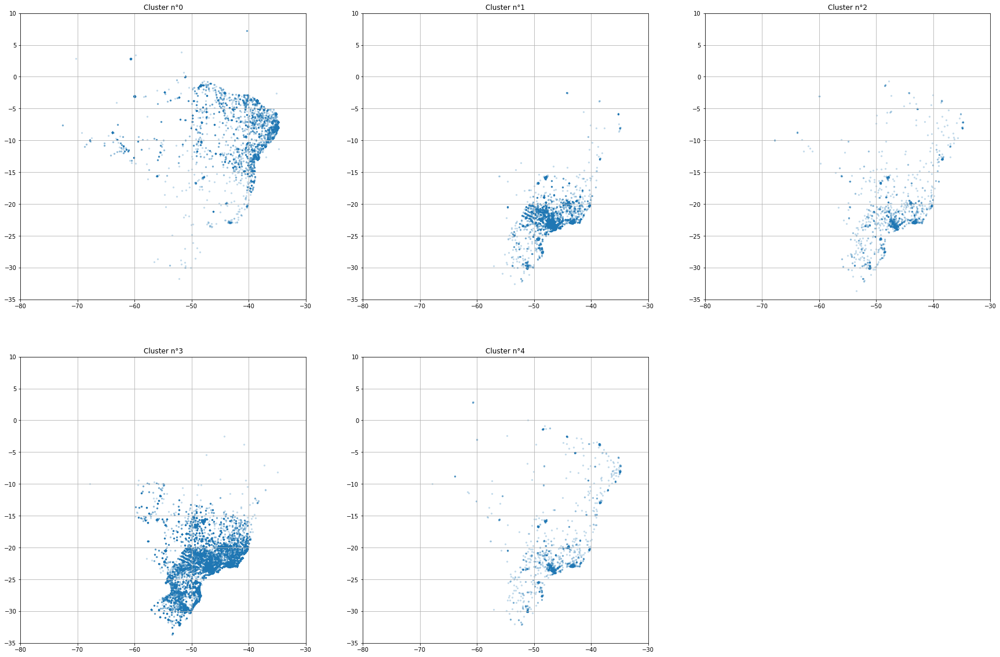

In [26]:
# Geolocation of customers by cluster
plt.figure(figsize = (30,20))
for i in np.arange(0,5,1):
    plt.subplot(2,3,i+1)
    df_ = df_clusters[df_clusters['cluster_5_means'] == i]
    plt.scatter(df_['customer_lng'], df_['customer_lat'], alpha = 0.2, s=5)
    plt.grid(True)
    plt.title('Cluster n°{}'.format(i))
    plt.xlim(-80,-30)
    plt.ylim(-35,10)

plt.show()

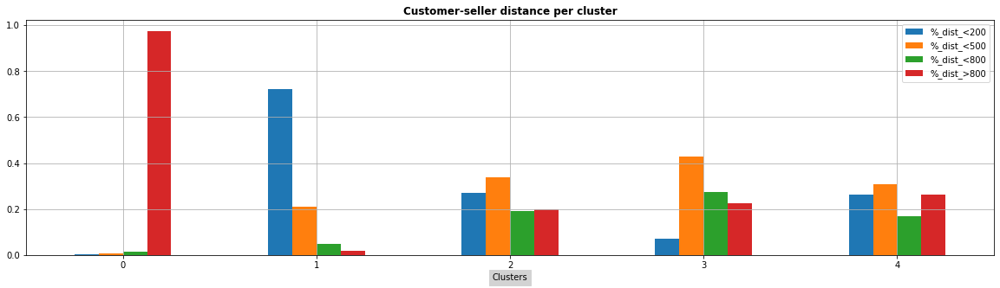

In [27]:
# Clusters by seller-customer distance
from POLIST_01_scripts import plot_cluster_descr
c_distance = df_clusters.columns[54:58]
plot_cluster_descr(df_clusters, c_distance, 'cluster_5_means', title = 'Customer-seller distance per cluster')

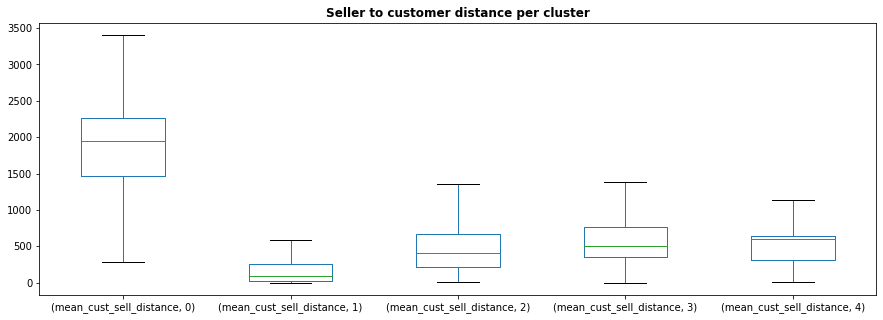

In [28]:
df_clusters[['mean_cust_sell_distance', 'cluster_5_means']].pivot(columns = 'cluster_5_means').plot.box( figsize = (15,5), showfliers = False)
plt.title('Seller to customer distance per cluster', fontweight = 'bold')
plt.show()

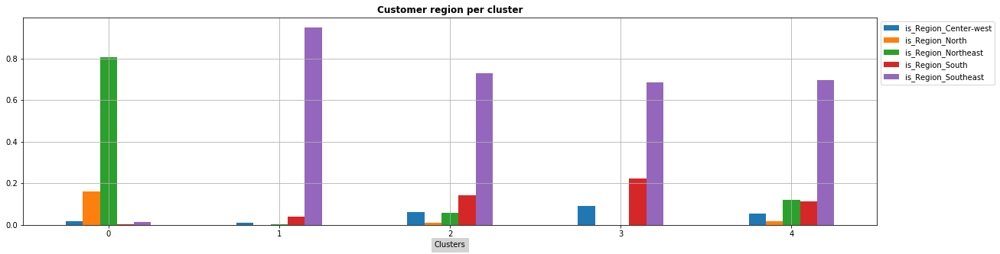

In [29]:
# Clusters by region
c_regions = df_clusters.columns[59:64]
plot_cluster_descr(df_clusters, c_regions, 'cluster_5_means', title = 'Customer region per cluster')

#### Order status

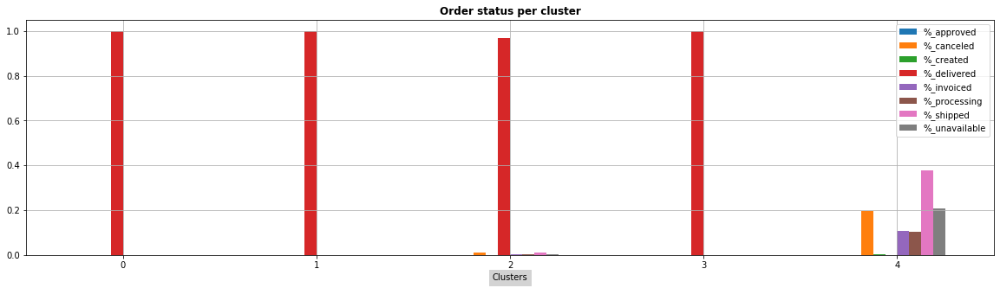

In [30]:
# Clusters by order_status
c_order_status = df_clusters.columns[4:12]
plot_cluster_descr(df_clusters, c_order_status, 'cluster_5_means', title = 'Order status per cluster')

#### Delivery time

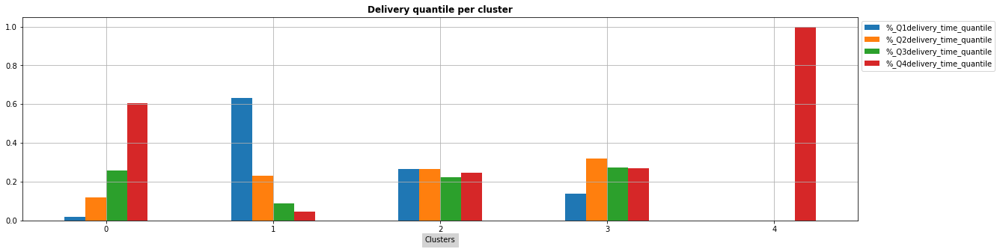

In [31]:
# Clusters by delivery_time
c_delivery_quantile = df_clusters.columns[15:19]
plot_cluster_descr(df_clusters, c_delivery_quantile, 'cluster_5_means', title = 'Delivery quantile per cluster')

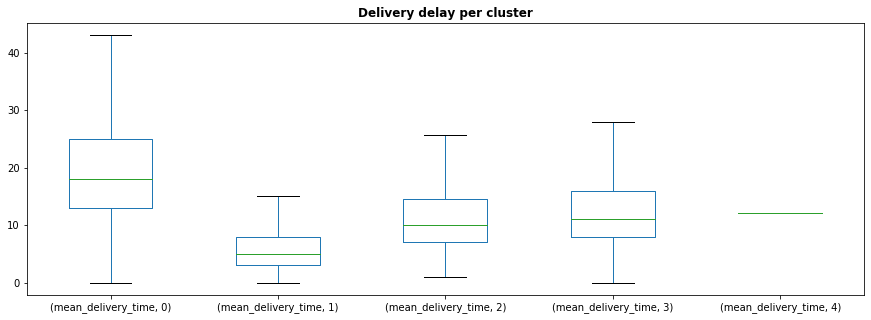

In [32]:
df_clusters[['mean_delivery_time', 'cluster_5_means']].pivot(columns = 'cluster_5_means').plot.box( figsize = (15,5), showfliers = False)
plt.title('Delivery delay per cluster', fontweight = 'bold')
plt.show()

#### Reviews

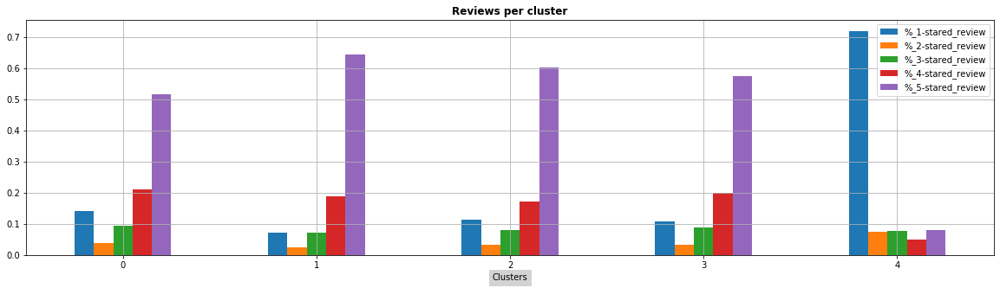

In [33]:
# Clusters by review
c_reviews = df_clusters.columns[48:53]
plot_cluster_descr(df_clusters, c_reviews, 'cluster_5_means', title = 'Reviews per cluster')

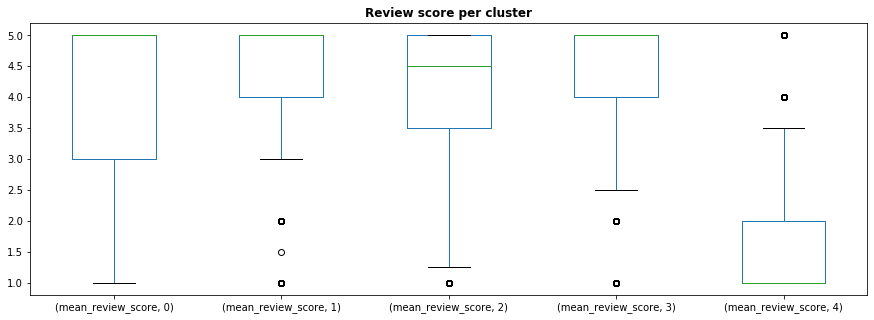

In [34]:
df_clusters[['mean_review_score', 'cluster_5_means']].pivot(columns = 'cluster_5_means').plot.box( figsize = (15,5), showfliers = True)
plt.title('Review score per cluster', fontweight = 'bold')
plt.show()

#### Products and price

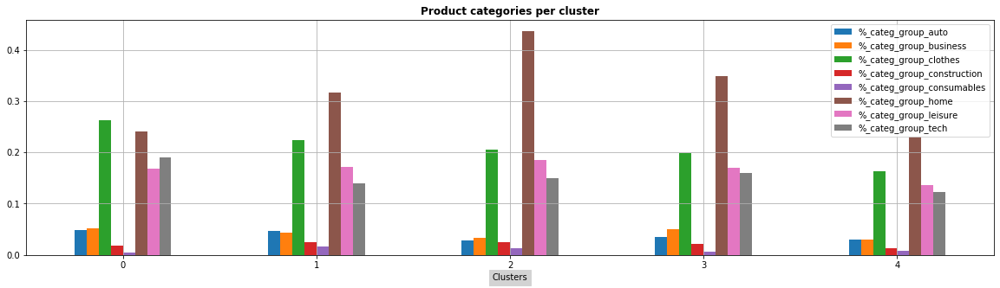

In [35]:
# Clusters by products
c_products = df_clusters.columns[64:-1]
plot_cluster_descr(df_clusters, c_products, 'cluster_5_means', title = 'Product categories per cluster')

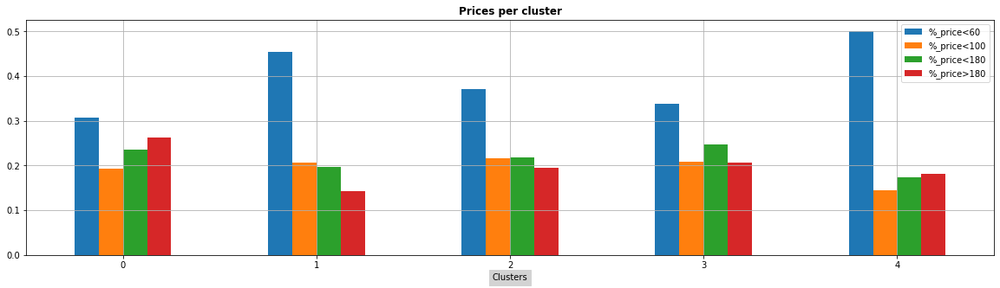

In [36]:
# Clusters by price
c_prices = df_clusters.columns[33:37]
plot_cluster_descr(df_clusters, c_prices, 'cluster_5_means', title = 'Prices per cluster')

### Radar Charts

In [37]:
radar_crit = ['%_delivered', 'mean_cust_sell_distance', 'is_Region_Southeast',
              'mean_delivery_time', '%_1-stared_review', '%_5-stared_review',
              '%_price<60', 'cluster_5_means']

df_radar = df_clusters[radar_crit].groupby('cluster_5_means').mean()

from sklearn.preprocessing import MinMaxScaler
minmax = MinMaxScaler()

df_radar_norm = pd.DataFrame(
    minmax.fit_transform(df_radar),
    index = df_radar.index,
    columns = df_radar.columns).T

df_radar_norm

cluster_5_means,0,1,2,3,4
%_delivered,0.999558,1.00000,0.968810,1.000000,0.000000
mean_cust_sell_distance,1.000000,0.00000,0.207212,0.241447,0.275371
is_Region_Southeast,0.000000,1.00000,0.763952,0.716351,0.729468
mean_delivery_time,1.000000,0.00000,0.360330,0.479145,0.400323
%_1-stared_review,0.105557,0.00000,0.065569,0.055199,1.000000
%_5-stared_review,0.774043,1.00000,0.929025,0.877984,0.000000
%_price<60,0.000000,0.76152,0.330274,0.158379,1.000000


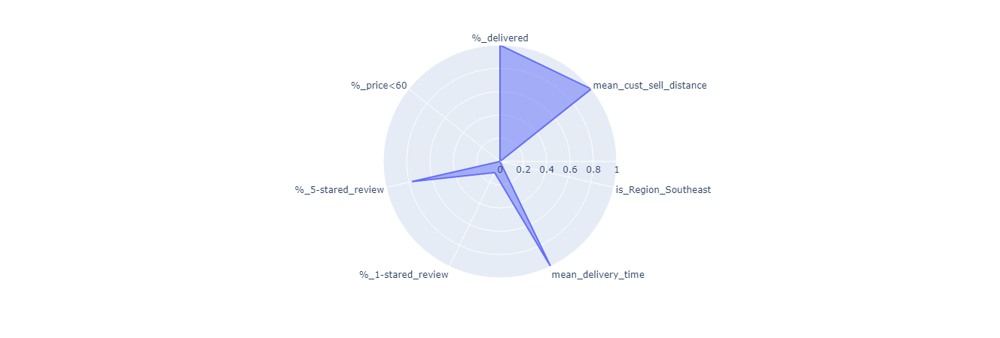

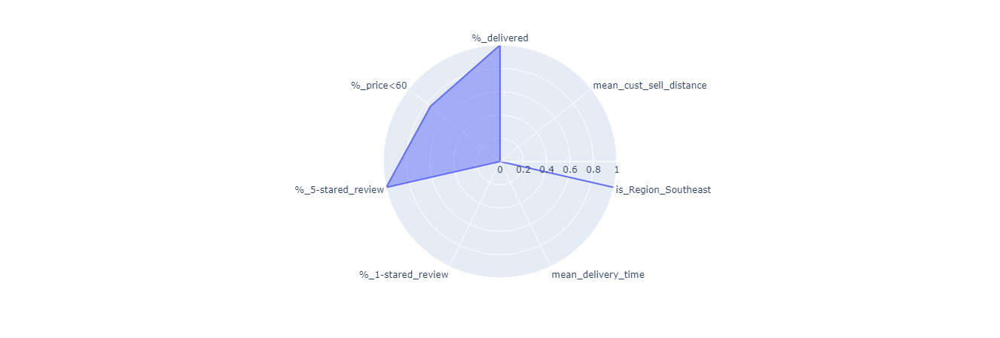

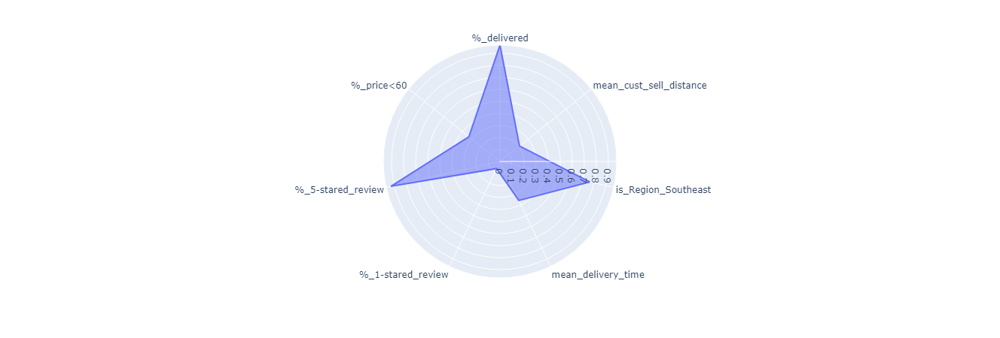

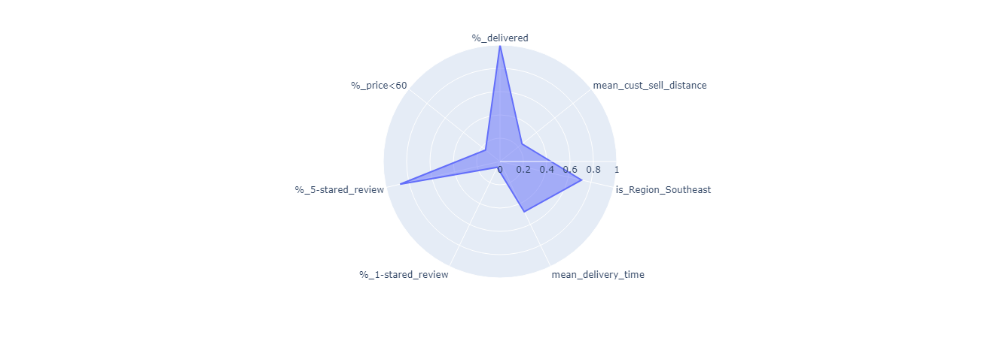

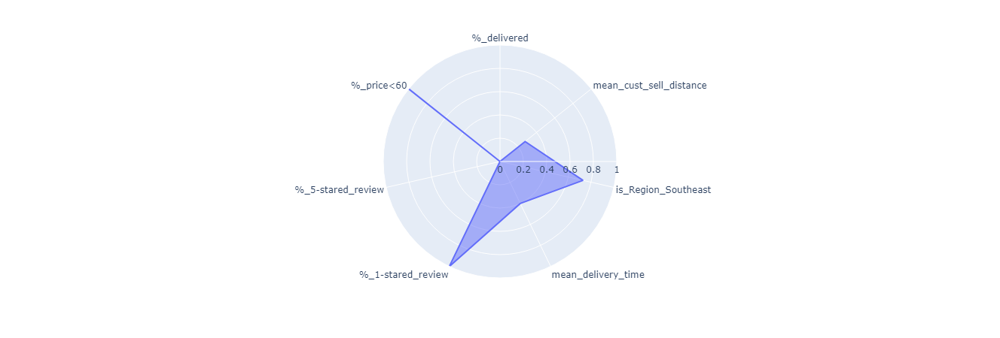

In [38]:
import plotly.express as px

for clt in range(5):
    fig = px.line_polar(df_radar_norm, r=clt, theta=df_radar_norm.index, line_close=True)
    fig.update_traces(fill='toself')
    fig.show()

# Dimensionality reduction

## PCA

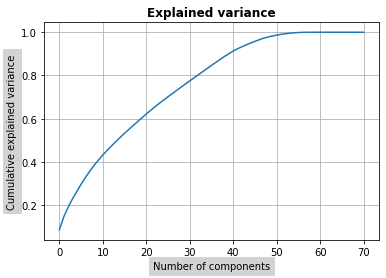

In [12]:
# PCA with multiple components
from sklearn import decomposition
pca = decomposition.PCA(n_components = data_scaled.shape[1])
pca.fit(data_scaled)
data_trans = pca.transform(data_scaled)

# Explained variance
plt.plot(pca.explained_variance_ratio_.cumsum())

plt.title('Explained variance', fontweight = 'bold')
plt.xlabel('Number of components', backgroundcolor = 'lightgrey')
plt.ylabel('Cumulative explained variance', backgroundcolor = 'lightgrey')

plt.grid(True)
plt.show()

30 components explain 80% of variance

In [13]:
pca = decomposition.PCA(n_components = 30)
pca.fit(data_scaled)
data_trans_30 = pca.transform(data_scaled)

In [20]:
data_trans_30[-10000:].shape

(10000, 30)

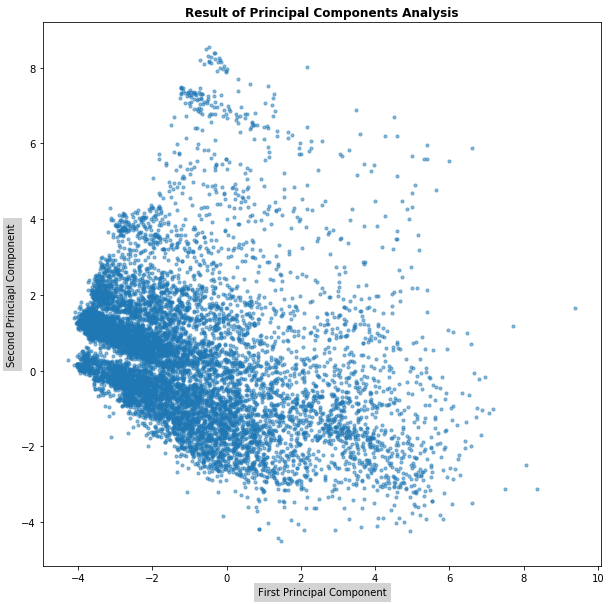

In [21]:
# Visualization
plt.figure(figsize = (10,10)) 
plt.scatter(
    data_trans_30[-10000:,0], data_trans_30[-10000:,1],
    s = 10, alpha = 0.5
)
plt.xlabel('First Principal Component', backgroundcolor = 'lightgrey')
plt.ylabel('Second Princiapl Component', backgroundcolor = 'lightgrey')
plt.title('Result of Principal Components Analysis', fontweight = 'bold')

plt.show()

## TSNE

In [22]:
# TSNE
from sklearn.manifold import TSNE
tsne = TSNE()
data_tsne = tsne.fit_transform(data_trans_30[-10000:])

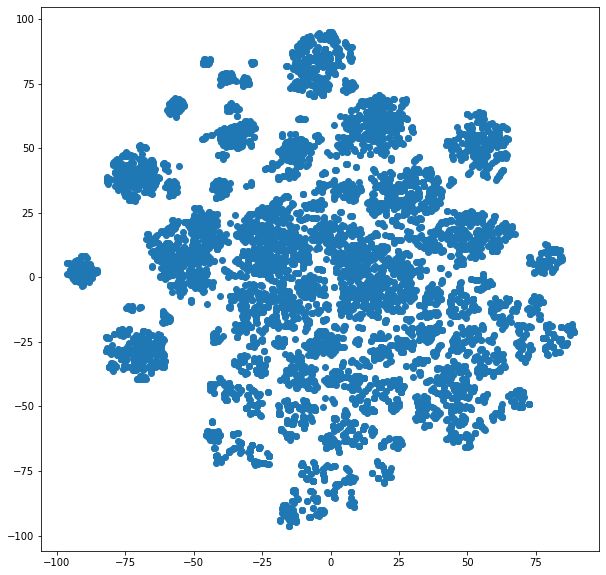

In [23]:
# Visualization
plt.figure(figsize = (10,10)) 
plt.scatter(
    data_tsne[:,0], data_tsne[:,1]
)
plt.show()

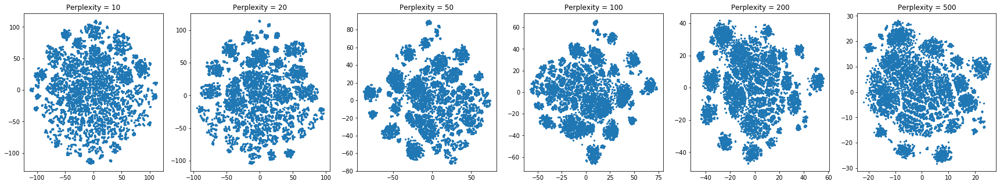

In [24]:
# TSNE for various perplexity values
plt.figure(figsize = (30, 5))
i = 0

for perplex in [10, 20, 50, 100, 200, 500]:
    tsne = TSNE(perplexity = perplex)
    data_tsne = tsne.fit_transform(data_trans_30[-10000:])
    
    i += 1
    plt.subplot(1,6,i)
    plt.scatter(data_tsne[:,0], data_tsne[:,1], s = 5)
    plt.title('Perplexity = {}'.format(perplex))
    
plt.show()

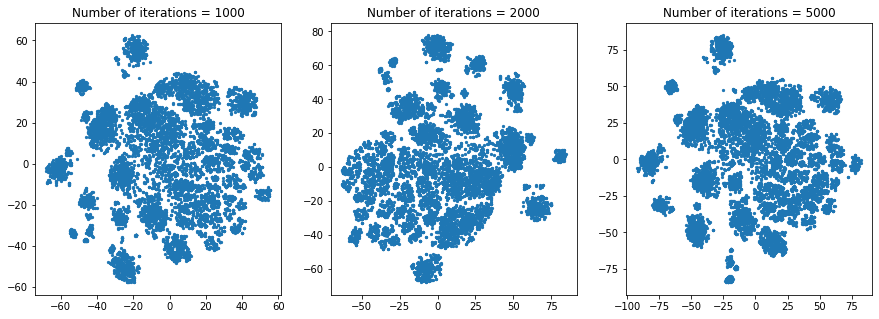

In [28]:
# TSNE for various n_iter values
plt.figure(figsize = (15, 5))
i = 0

for niter in [1000, 2000, 5000]:
    tsne = TSNE(perplexity = 100, n_iter = niter)
    data_tsne = tsne.fit_transform(data_trans_30[-10000:])
    
    i += 1
    plt.subplot(1,3,i)
    plt.scatter(data_tsne[:,0], data_tsne[:,1], s = 5)
    plt.title('Number of iterations = {}'.format(niter))
    
plt.show()

In [32]:
tsne = TSNE(n_components = 2, perplexity = 100, n_iter = 2000)
data_tsne = tsne.fit_transform(data_trans_30[-10000:])

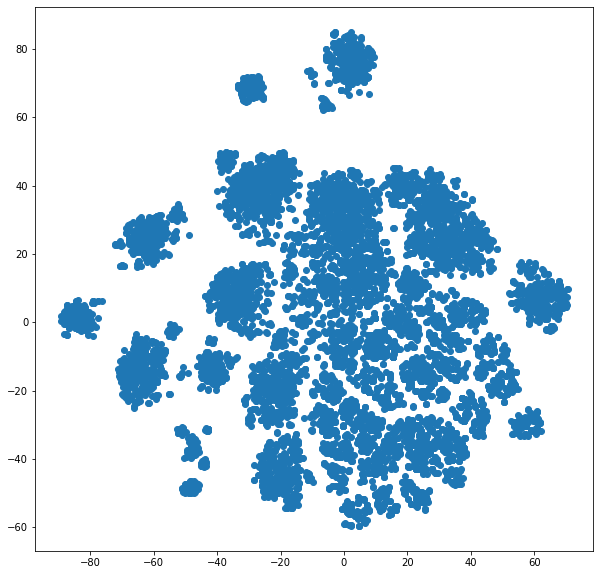

In [264]:
# Visualization
plt.figure(figsize = (10,10)) 
plt.scatter(
    data_tsne[:,0], data_tsne[:,1]
)
plt.show()

## LLE

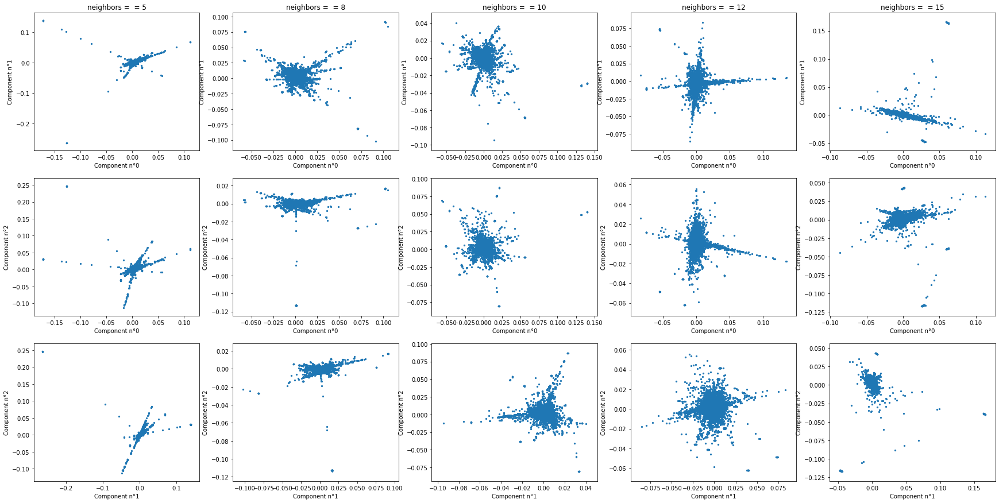

In [34]:
from sklearn.manifold import LocallyLinearEmbedding

plt.figure(figsize = (30, 15))
i = 0

for neigh in [5, 8, 10, 12, 15]:
    lle = LocallyLinearEmbedding(n_components = 3, n_neighbors = neigh)
    data_lle = lle.fit_transform(data_trans_30[-10000:])
    
    i += 1
    plt.subplot(3,5,i)
    plt.scatter(data_lle[:,0], data_lle[:,1], s = 5)
    plt.xlabel('Component n°0')
    plt.ylabel('Component n°1')
    plt.title('neighbors = {}'.format(neigh))
    
    plt.subplot(3,5, 5+i)
    plt.scatter(data_lle[:,0], data_lle[:,2], s = 5)
    plt.xlabel('Component n°0')
    plt.ylabel('Component n°2')
    
    plt.subplot(3,5, 10+i)
    plt.scatter(data_lle[:,1], data_lle[:,2], s = 5)
    plt.xlabel('Component n°1')
    plt.ylabel('Component n°2')
    
plt.show()

## Isomap

In [35]:
from sklearn.manifold import Isomap
iso = Isomap(n_components = 3)
data_iso = iso.fit_transform(data_trans_30[-10000:])

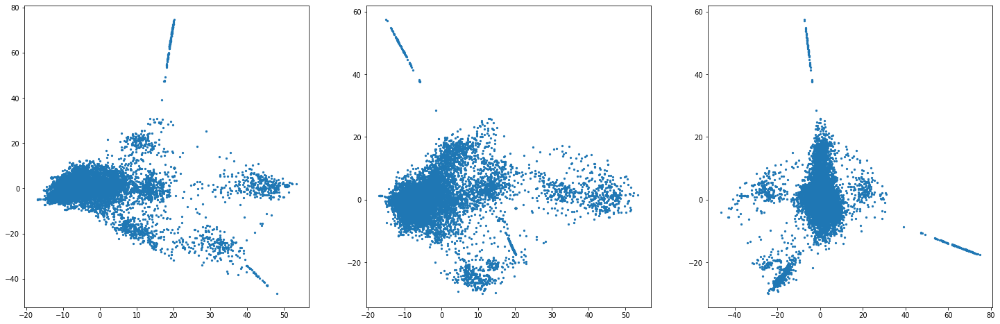

In [36]:
# Visualization
plt.figure(figsize = (25,8))
plt.subplot(131)
plt.scatter(
    data_iso[:,0], data_iso[:,1], s = 5
)

plt.subplot(132)
plt.scatter(
    data_iso[:,0], data_iso[:,2], s = 5
)

plt.subplot(133)
plt.scatter(
    data_iso[:,1], data_iso[:,2], s = 5
)
plt.show()

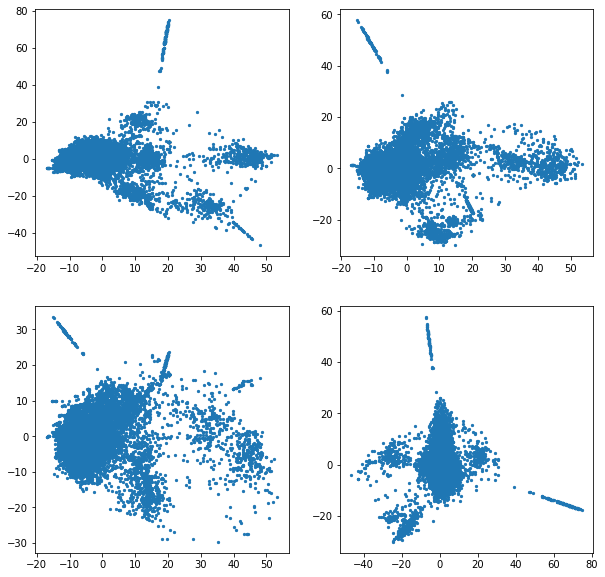

In [267]:
# Visualization
iso1 = Isomap(n_components = 4)
data_iso1= iso1.fit_transform(data_trans_30[-10000:])
plt.figure(figsize = (10,10))
plt.subplot(221)
plt.scatter(
    data_iso1[:,0], data_iso1[:,1], s = 5
)

plt.subplot(222)
plt.scatter(
    data_iso1[:,0], data_iso1[:,2], s = 5
)

plt.subplot(223)
plt.scatter(
    data_iso1[:,0], data_iso1[:,3], s = 5
)

plt.subplot(224)
plt.scatter(
    data_iso1[:,1], data_iso1[:,2], s = 5
)
plt.show()

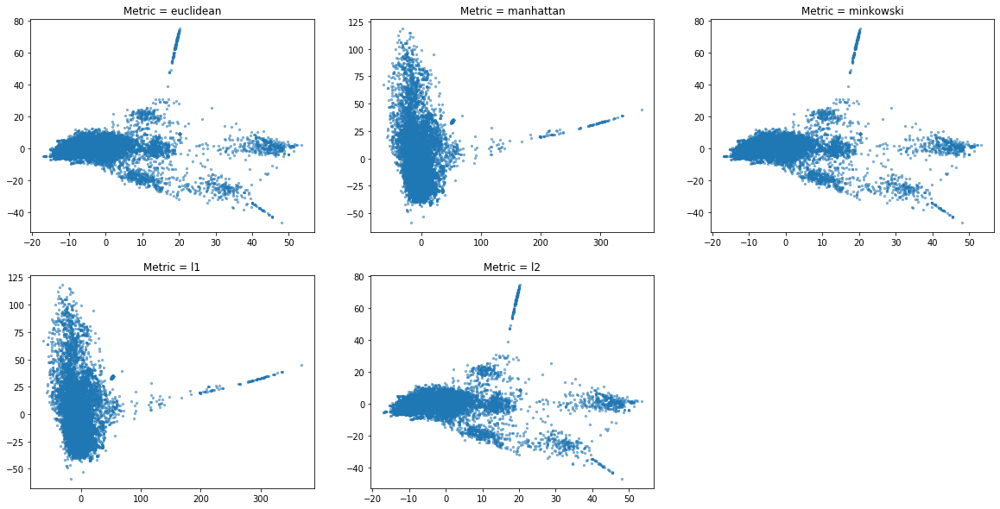

In [37]:
plt.figure(figsize = (20,10))
i = 0

for dist in ['euclidean', 'manhattan', 'minkowski', 'l1', 'l2']:
    i+=1
    iso2 = Isomap(n_components = 2, metric = dist)
    data_iso2 = iso2.fit_transform(data_trans_30[-10000:])
    plt.subplot(2,3,i)
    plt.scatter(data_iso2[:,0], data_iso2[:,1], s = 5, alpha = 0.5)
    plt.title('Metric = {}'.format(dist))
    
plt.show()

# Kmeans on data_iso

## Number of clusters

In [40]:
# Training with K-means for 2 to 10 clusters
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
inertias = []
silhouettes = []

for n_clts in range(2,11):
    print('Training with {} clusters'.format(n_clts))
    # Training
    kmeans = KMeans(n_clusters = n_clts)
    kmeans.fit(data_iso)
    
    # Scores
    inertias.append(kmeans.inertia_)
    sil = silhouette_score(data_iso, kmeans.labels_)
    silhouettes.append(sil)

Training with 2 clusters
Training with 3 clusters
Training with 4 clusters
Training with 5 clusters
Training with 6 clusters
Training with 7 clusters
Training with 8 clusters
Training with 9 clusters
Training with 10 clusters


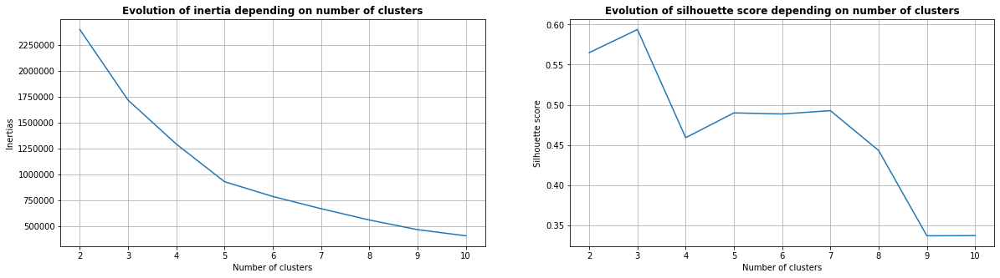

In [41]:
# Visualisation of inertia depending on the number of clusters
plt.figure(figsize = (20,5))
plt.subplot(121)
plt.plot(range(2,11), inertias)

plt.title('Evolution of inertia depending on number of clusters',fontweight = 'bold')
plt.xlabel('Number of clusters')
plt.ylabel('Inertias')
plt.grid(True)

plt.subplot(122)
plt.plot(range(2,11), silhouettes)

plt.title('Evolution of silhouette score depending on number of clusters',fontweight = 'bold')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.grid(True)

plt.show()

## Visualization with 3 clusters on isomapped data

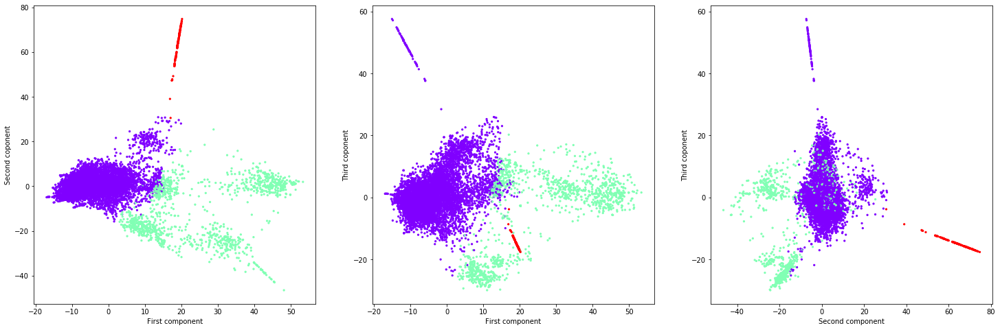

In [51]:
# Training with 3 clusters
kmeans = KMeans(n_clusters = 3)
kmeans.fit(data_iso)

# Visualization
plt.figure(figsize = (25,8))
plt.subplot(131)
plt.scatter(data_iso[:,0], data_iso[:,1], s = 5, c = kmeans.labels_, cmap = 'rainbow')
plt.xlabel('First component')
plt.ylabel('Second coponent')

plt.subplot(132)
plt.scatter(data_iso[:,0], data_iso[:,2], s = 5, c = kmeans.labels_, cmap = 'rainbow')
plt.xlabel('First component')
plt.ylabel('Third coponent')

plt.subplot(133)
plt.scatter(data_iso[:,1], data_iso[:,2], s = 5, c = kmeans.labels_, cmap = 'rainbow')
plt.xlabel('Second component')
plt.ylabel('Third coponent')

plt.show()

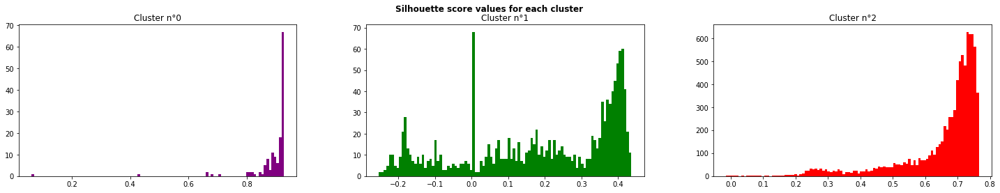

In [49]:
# Silhouette score values for each cluster
from sklearn.metrics import silhouette_samples
sample_silhouette_values = silhouette_samples(data_iso, kmeans.labels_)

plt.figure(figsize = (25,4))
plt.subplots_adjust(wspace=0.25)
c_colors = ['purple', 'green', 'red']

for i in range(3):
    plt.subplot(1,3,i+1)
    ith_cluster_silhouette_values = sample_silhouette_values[kmeans.labels_ == i]
    plt.hist(ith_cluster_silhouette_values, bins = 100, cumulative = False, color = c_colors[i])
    plt.title('Cluster n°{}'.format(i))
    
plt.suptitle('Silhouette score values for each cluster', fontweight = 'bold')
plt.show()

## Visualization with 5 clusters on isomapped data

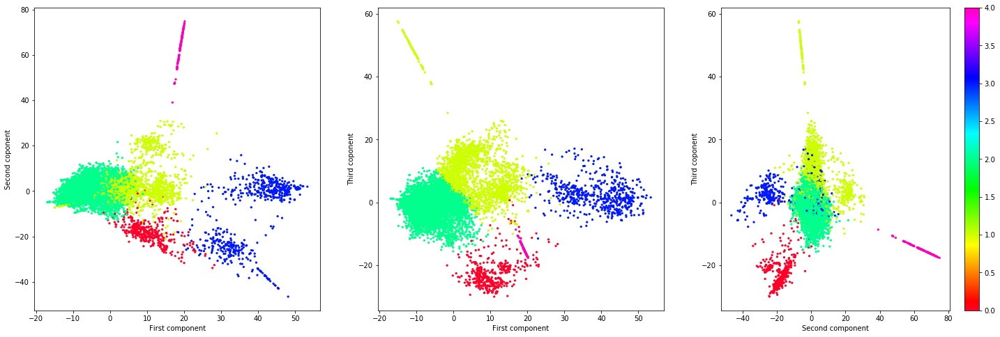

In [65]:
# Training with 5 clusters
kmeans = KMeans(n_clusters = 5)
kmeans.fit(data_iso)

# Visualization
plt.figure(figsize = (25,8))
plt.subplot(131)
plt.scatter(data_iso[:,0], data_iso[:,1], s = 5, c = kmeans.labels_, cmap = 'gist_rainbow')
plt.xlabel('First component')
plt.ylabel('Second coponent')

plt.subplot(132)
plt.scatter(data_iso[:,0], data_iso[:,2], s = 5, c = kmeans.labels_, cmap = 'gist_rainbow')
plt.xlabel('First component')
plt.ylabel('Third coponent')

plt.subplot(133)
plt.scatter(data_iso[:,1], data_iso[:,2], s = 5, c = kmeans.labels_, cmap = 'gist_rainbow')
plt.xlabel('Second component')
plt.ylabel('Third coponent')
plt.colorbar()

plt.show()

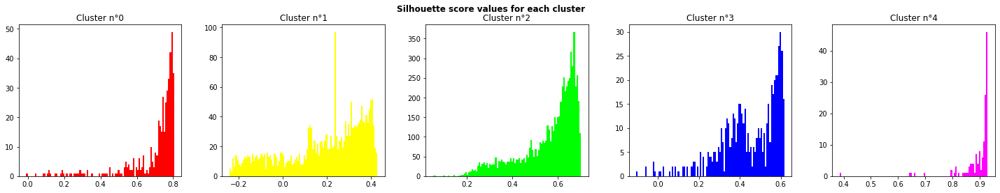

In [67]:
# Silhouette score values for each cluster
sample_silhouette_values = silhouette_samples(data_iso, kmeans.labels_)
plt.figure(figsize = (25,4))
plt.subplots_adjust(wspace=0.25)
c_colors = ['red', 'yellow', 'lime','blue', 'magenta']

for i in range(5):
    plt.subplot(1,5,i+1)
    ith_cluster_silhouette_values = sample_silhouette_values[kmeans.labels_ == i]
    plt.hist(ith_cluster_silhouette_values, bins = 100, cumulative = False, color = c_colors[i])
    plt.title('Cluster n°{}'.format(i))
    
plt.suptitle('Silhouette score values for each cluster', fontweight = 'bold')
plt.show()

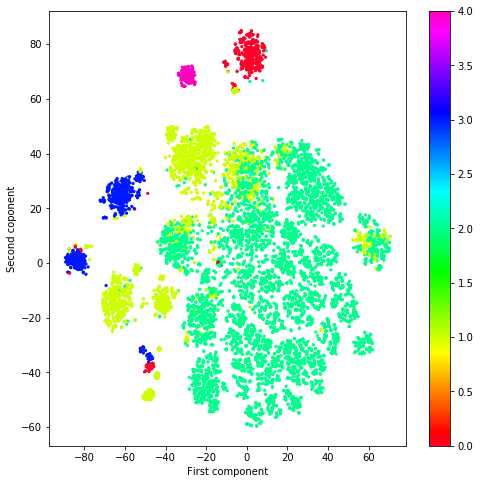

In [256]:
# Projection on tsne
plt.figure(figsize = (8,8))

plt.scatter(data_tsne[:,0], data_tsne[:,1], s = 5, c = kmeans.labels_, cmap = 'gist_rainbow')
plt.xlabel('First component')
plt.ylabel('Second coponent')
plt.colorbar()

plt.show()

## Cluster description

In [81]:
# Dedicated dataset
df_cluster_iso = data.iloc[-10000:].copy()
df_cluster_iso['labels'] = kmeans.labels_

In [82]:
# Mean characteristics per clusters
df_cluster_iso.groupby(by = 'labels').mean()

,nb_of_orders,customer_lat,customer_lng,%_approved,%_canceled,%_created,%_delivered,%_invoiced,%_processing,%_shipped,%_unavailable,mean_delivery_time,mean_estimated_time,mean_delivery_delay,%_Q1delivery_time_quantile,%_Q2delivery_time_quantile,%_Q3delivery_time_quantile,%_Q4delivery_time_quantile,%_Q1estimated_time_quantile,%_Q2estimated_time_quantile,%_Q3estimated_time_quantile,%_Q4estimated_time_quantile,%_Q1delivery_delay_quantile,%_Q2delivery_delay_quantile,%_Q3delivery_delay_quantile,%_Q4delivery_delay_quantile,mean_number_of_products_per_order,mean_number_of_sellers_per_order,mean_price,mean_freight_value,mean_payment_value,mean_%_freight_value,%_price<60,%_price<100,%_price<180,%_price>180,total,%_boleto,%_credit_card,%_debit_card,%_not_defined,%_voucher,payment_installments,mean_review_score,mean_review_delay,mean_review_has_title,mean_review_has_message,%_1-stared_review,%_2-stared_review,%_3-stared_review,%_4-stared_review,%_5-stared_review,mean_cust_sell_distance,%_dist_<200,%_dist_<500,%_dist_<800,%_dist_>800,mean_purchase_delta,is_Region_Center-west,is_Region_North,is_Region_Northeast,is_Region_South,is_Region_Southeast,%_categ_group_auto,%_categ_group_business,%_categ_group_clothes,%_categ_group_construction,%_categ_group_consumables,%_categ_group_home,%_categ_group_leisure,%_categ_group_tech
labels,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,1.025114,-22.491637,-46.613697,0.0,0.120244,0.0,0.879756,0.000000,0.000000,0.000000,0.000000,8.250234,14.384513,-8.288814,0.439362,0.242335,0.128425,0.189878,0.718607,0.146445,0.089041,0.045907,0.087003,0.146445,0.234209,0.532344,1.250761,1.006469,207.590476,25.737568,342.353253,0.176486,0.287671,0.176941,0.280822,0.254566,1.025114,0.179011,0.759701,0.034247,0.0,0.027042,3.175799,3.946347,2.010274,0.376712,0.383562,0.148402,0.031963,0.091324,0.181507,0.546804,390.729059,0.424307,0.301665,0.145981,0.128047,0.291096,0.059361,0.000000,0.029680,0.134703,0.776256,0.010464,0.002283,0.021689,0.870557,0.002283,0.053589,0.025114,0.015221
1,1.009314,-17.509954,-43.637224,0.0,0.000490,0.0,0.938480,0.015196,0.000490,0.036029,0.009314,9.927451,22.085948,-13.434153,0.256373,0.343913,0.225899,0.173815,0.342647,0.201389,0.216258,0.239706,0.335662,0.221283,0.168954,0.274101,1.127369,1.018873,155.368164,30.615706,215.285138,0.230864,0.350980,0.171324,0.259314,0.218382,1.009314,0.183824,0.783901,0.011275,0.0,0.021001,2.977288,3.876307,1.972345,0.453595,0.486275,0.125000,0.112010,0.054248,0.179289,0.529453,976.861565,0.164827,0.206103,0.112559,0.516511,0.380637,0.068627,0.000490,0.351961,0.060784,0.518137,0.242974,0.075490,0.252941,0.011193,0.010539,0.186726,0.090091,0.117778
2,1.000000,-22.904573,-46.870291,0.0,0.000000,0.0,1.000000,0.000000,0.000000,0.000000,0.000000,6.840147,13.830588,-7.613382,0.549853,0.315441,0.097941,0.036765,0.765588,0.148088,0.056471,0.029853,0.075735,0.159412,0.304853,0.460000,1.167059,1.015588,130.072569,22.658437,179.248694,0.202617,0.389265,0.218676,0.225588,0.166471,1.000000,0.195147,0.778195,0.000147,0.0,0.026510,2.726176,4.392500,1.958162,0.335588,0.352426,0.067941,0.000662,0.071471,0.190809,0.669118,390.313925,0.356517,0.344188,0.171265,0.128030,0.000000,0.053529,0.000000,0.005882,0.148088,0.792500,0.001667,0.039265,0.247917,0.001373,0.022328,0.398465,0.143116,0.140365
3,1.386207,-22.184203,-46.328743,0.0,0.077299,0.0,0.918186,0.000862,0.000493,0.002299,0.000862,7.952754,16.085066,-9.087272,0.469161,0.246613,0.144997,0.139228,0.637872,0.166964,0.108752,0.086412,0.127816,0.155557,0.262515,0.454112,1.075000,0.938218,121.158776,20.815290,193.659103,0.187648,0.435489,0.206466,0.201868,0.156178,1.386207,0.066468,0.233220,0.619302,0.0,0.081010,1.656609,4.115948,1.907615,0.380460,0.428951,0.117131,0.022701,0.073649,0.199131,0.587388,458.496116,0.357569,0.291291,0.160442,0.190698,35.487356,0.041379,0.005172,0.062069,0.134483,0.756897,0.039330,0.040620,0.202560,0.005993,0.032509,0.363805,0.114916,0.158847
4,1.000000,-4.758484,-52.314074,0.0

In [83]:
df_anova_5m =(df_cluster_iso.groupby(by = 'labels').mean()/df_cluster_iso.drop(columns = 'labels').mean()).T

In [119]:
def highlight_max(s):
    is_max = s == s.max()
    return ['background-color: yellow' if v else '' for v in is_max]

def sw_coeff(cluster_label):
    coeff_str = df_anova_5m.sort_values(by = [cluster_label], ascending = False).head(10).index.tolist()
    df_ = df_cluster_iso.groupby(by = 'labels').mean()[coeff_str].style.apply(highlight_max)
    #coeff_wea = df_anova_5m.sort_values(by = [cluster_label], ascending = False).tail(10).index.tolist()
    #df_ = df_cluster_iso.groupby(by = 'labels').mean()[coeff_str + coeff_wea].style.apply(highlight_max)
    
    return df_

In [120]:
# Strongest & weakest Anova coefficients for cluster 0
sw_coeff(0)

,%_categ_group_construction,%_canceled,%_Q4delivery_time_quantile,mean_payment_value,%_1-stared_review,mean_price,%_price>180,%_dist_<200,%_3-stared_review,%_Q4delivery_delay_quantile
labels,,,,,,,,,,
0,0.870557,0.120244,0.189878,342.353253,0.148402,207.590476,0.254566,0.424307,0.091324,0.532344
1,0.011193,0.000490,0.173815,215.285138,0.125000,155.368164,0.218382,0.164827,0.054248,0.274101
2,0.001373,0.000000,0.036765,179.248694,0.067941,130.072569,0.166471,0.356517,0.071471,0.460000
3,0.005993,0.077299,0.139228,193.659103,0.117131,121.158776,0.156178,0.357569,0.073649,0.454112
4,0.030516,0.000000,0.316901,334.386972,0.035211,219.483310,0.295775,0.000000,0.049296,0.112676


In [123]:
# Strongest & weakest Anova coefficients for cluster 1
sw_coeff(1)

,%_invoiced,%_shipped,%_unavailable,%_categ_group_auto,is_Region_Northeast,%_2-stared_review,%_processing,%_Q4estimated_time_quantile,%_Q1delivery_delay_quantile,%_dist_>800
labels,,,,,,,,,,
0,0.000000,0.000000,0.000000,0.010464,0.029680,0.031963,0.000000,0.045907,0.087003,0.128047
1,0.015196,0.036029,0.009314,0.242974,0.351961,0.112010,0.000490,0.239706,0.335662,0.516511
2,0.000000,0.000000,0.000000,0.001667,0.005882,0.000662,0.000000,0.029853,0.075735,0.128030
3,0.000862,0.002299,0.000862,0.039330,0.062069,0.022701,0.000493,0.086412,0.127816,0.190698
4,0.000000,0.000000,0.000000,0.056338,0.000000,0.021127,0.000000,0.443662,0.394366,1.000000


In [125]:
# Strongest & weakest Anova coefficients for cluster 2
sw_coeff(2)

,%_categ_group_home,is_Region_South,%_Q1delivery_time_quantile,%_Q1estimated_time_quantile,%_categ_group_consumables,%_categ_group_leisure,%_Q3delivery_delay_quantile,%_dist_<200,%_dist_<500,%_dist_<800
labels,,,,,,,,,,
0,0.053589,0.134703,0.439362,0.718607,0.002283,0.025114,0.234209,0.424307,0.301665,0.145981
1,0.186726,0.060784,0.256373,0.342647,0.010539,0.090091,0.168954,0.164827,0.206103,0.112559
2,0.398465,0.148088,0.549853,0.765588,0.022328,0.143116,0.304853,0.356517,0.344188,0.171265
3,0.363805,0.134483,0.469161,0.637872,0.032509,0.114916,0.262515,0.357569,0.291291,0.160442
4,0.203219,0.000000,0.014085,0.070423,0.007042,0.119718,0.161972,0.000000,0.000000,0.000000


In [88]:
# Strongest & weakest Anova coefficients for cluster 3
sw_coeff(3)

,mean_purchase_delta,%_debit_card,%_canceled,%_processing,%_voucher,%_Q4delivery_time_quantile,%_categ_group_consumables,%_1-stared_review,nb_of_orders,total,%_unavailable,%_boleto,is_Region_North,%_credit_card,%_shipped,%_invoiced,%_categ_group_construction,%_approved,%_created,%_not_defined
labels,,,,,,,,,,,,,,,,,,,,
0,0.291096,0.034247,0.120244,0.000000,0.027042,0.189878,0.002283,0.148402,1.025114,1.025114,0.000000,0.179011,0.000000,0.759701,0.000000,0.000000,0.870557,0.000000,0.000000,0.000000
1,0.380637,0.011275,0.000490,0.000490,0.021001,0.173815,0.010539,0.125000,1.009314,1.009314,0.009314,0.183824,0.000490,0.783901,0.036029,0.015196,0.011193,0.000000,0.000000,0.000000
2,0.000000,0.000147,0.000000,0.000000,0.026510,0.036765,0.022328,0.067941,1.000000,1.000000,0.000000,0.195147,0.000000,0.778195,0.000000,0.000000,0.001373,0.000000,0.000000,0.000000
3,35.487356,0.619302,0.077299,0.000493,0.081010,0.139228,0.032509,0.117131,1.386207,1.386207,0.000862,0.066468,0.005172,0.233220,0.002299,0.000862,0.005993,0.000000,0.000000,0.000000
4,0.000000,0.056338,0.000000,0.000000,0.034481,0.316901,0.007042,0.035211,1.000000,1.000000,0.000000,0.253521,1.000000,0.655660,0.000000,0.000000,0.030516,0.000000,0.000000,0.000000


In [89]:
# Strongest & weakest Anova coefficients for cluster 4
sw_coeff(4)

,is_Region_North,%_Q4estimated_time_quantile,%_dist_>800,mean_cust_sell_distance,%_Q4delivery_time_quantile,%_Q3delivery_time_quantile,%_Q1delivery_delay_quantile,%_Q3estimated_time_quantile,mean_freight_value,%_Q2delivery_delay_quantile,is_Region_Northeast,%_shipped,mean_purchase_delta,%_dist_<800,%_dist_<500,%_dist_<200,%_unavailable,%_approved,%_created,%_not_defined
labels,,,,,,,,,,,,,,,,,,,,
0,0.000000,0.045907,0.128047,390.729059,0.189878,0.128425,0.087003,0.089041,25.737568,0.146445,0.029680,0.000000,0.291096,0.145981,0.301665,0.424307,0.000000,0.000000,0.000000,0.000000
1,0.000490,0.239706,0.516511,976.861565,0.173815,0.225899,0.335662,0.216258,30.615706,0.221283,0.351961,0.036029,0.380637,0.112559,0.206103,0.164827,0.009314,0.000000,0.000000,0.000000
2,0.000000,0.029853,0.128030,390.313925,0.036765,0.097941,0.075735,0.056471,22.658437,0.159412,0.005882,0.000000,0.000000,0.171265,0.344188,0.356517,0.000000,0.000000,0.000000,0.000000
3,0.005172,0.086412,0.190698,458.496116,0.139228,0.144997,0.127816,0.108752,20.815290,0.155557,0.062069,0.002299,35.487356,0.160442,0.291291,0.357569,0.000862,0.000000,0.000000,0.000000
4,1.000000,0.443662,1.000000,2241.228562,0.316901,0.394366,0.394366,0.246479,48.437887,0.330986,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


## Visualisations

### Geography

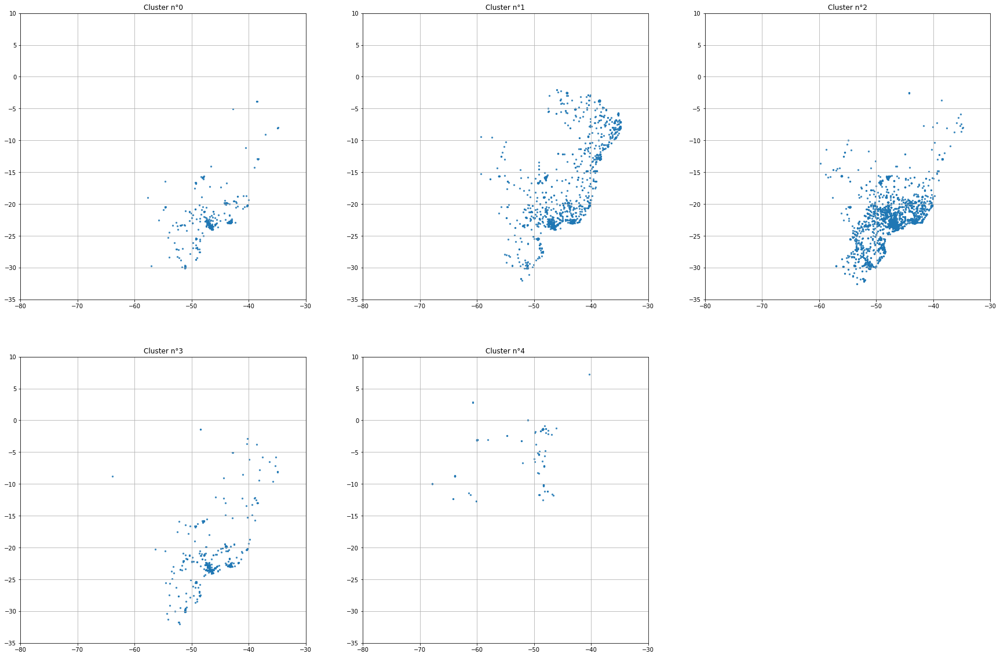

In [90]:
# Geolocation of customers by cluster
plt.figure(figsize = (30,20))
for i in np.arange(0,5,1):
    plt.subplot(2,3,i+1)
    df_ = df_cluster_iso[df_cluster_iso['labels'] == i]
    plt.scatter(df_['customer_lng'], df_['customer_lat'], alpha = 0.8, s=5)
    plt.grid(True)
    plt.title('Cluster n°{}'.format(i))
    plt.xlim(-80,-30)
    plt.ylim(-35,10)

plt.show()

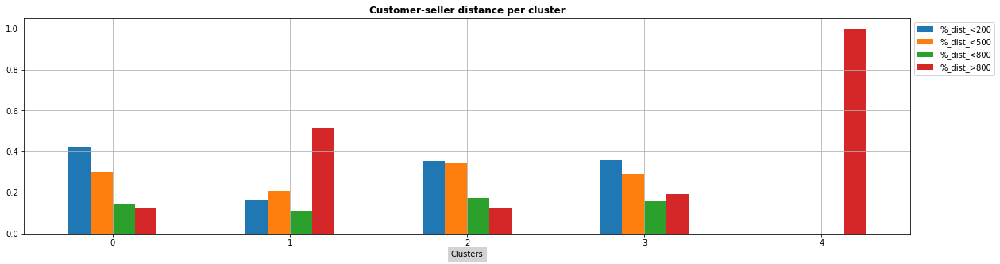

In [91]:
# Clusters by seller-customer distance
from POLIST_01_scripts import plot_cluster_descr
c_distance = df_cluster_iso.columns[54:58]
plot_cluster_descr(df_cluster_iso, c_distance, 'labels', title = 'Customer-seller distance per cluster')

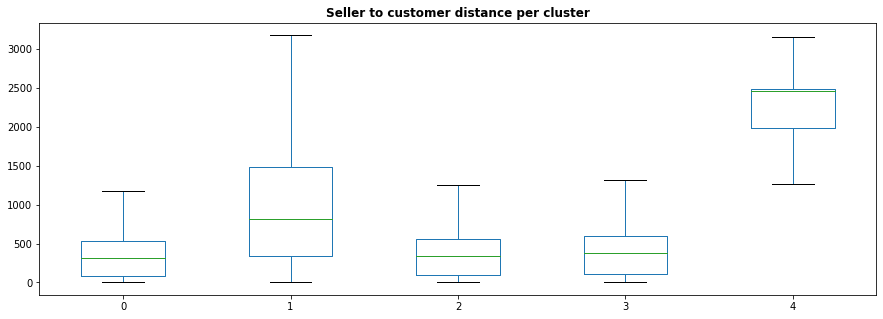

In [92]:
df_ = df_cluster_iso[['mean_cust_sell_distance', 'labels']]
df_.index = range(len(df_))
df_.pivot(columns = 'labels', values = 'mean_cust_sell_distance').plot.box( figsize = (15,5), showfliers = False)
plt.title('Seller to customer distance per cluster', fontweight = 'bold')
plt.show()

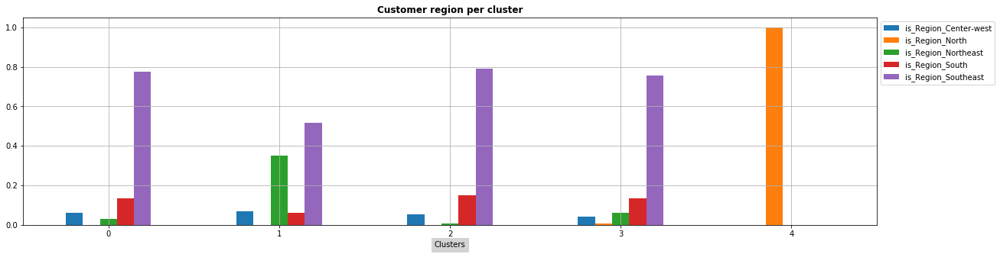

In [93]:
# Clusters by region
c_regions = df_cluster_iso.columns[59:64]
plot_cluster_descr(df_cluster_iso, c_regions, 'labels', title = 'Customer region per cluster')

### Order status

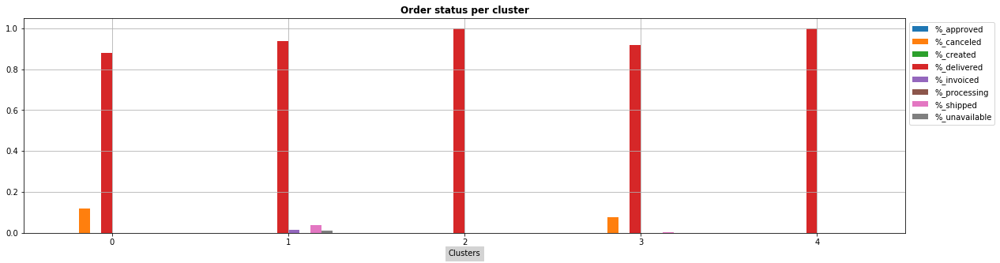

In [94]:
# Clusters by order_status
c_order_status = df_cluster_iso.columns[4:12]
plot_cluster_descr(df_cluster_iso, c_order_status, 'labels', title = 'Order status per cluster')

### Delivery time

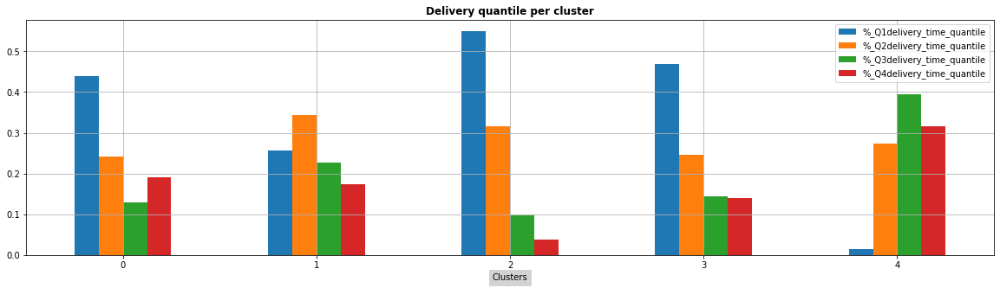

In [95]:
# Clusters by delivery_time
c_delivery_quantile = df_cluster_iso.columns[15:19]
plot_cluster_descr(df_cluster_iso, c_delivery_quantile, 'labels', title = 'Delivery quantile per cluster')

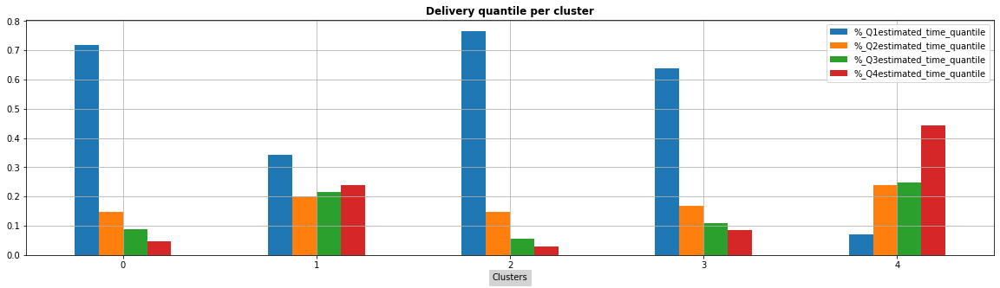

In [96]:
# Clusters by estimated delivery_time
c_delivery_quantile = df_cluster_iso.columns[19:23]
plot_cluster_descr(df_cluster_iso, c_delivery_quantile, 'labels', title = 'Delivery quantile per cluster')

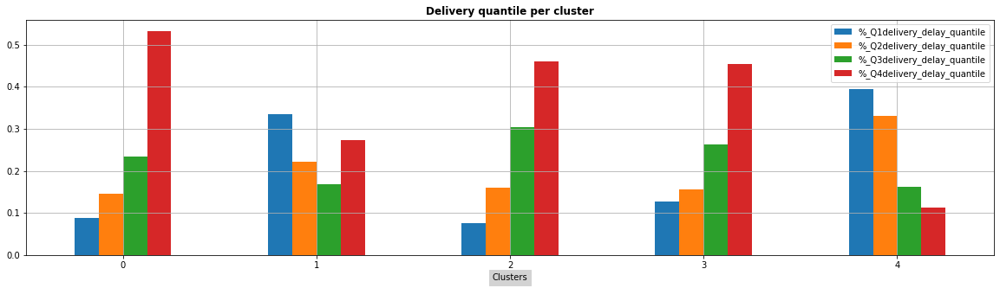

In [97]:
# Clusters by estimated delivery_time
c_delivery_quantile = df_cluster_iso.columns[23:27]
plot_cluster_descr(df_cluster_iso, c_delivery_quantile, 'labels', title = 'Delivery quantile per cluster')

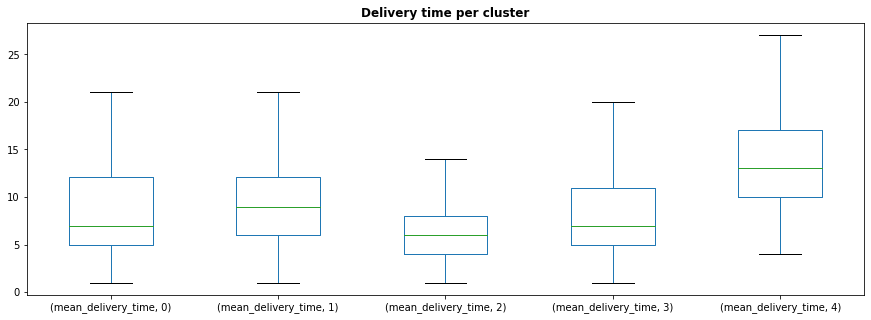

In [98]:
df_ = df_cluster_iso[['mean_delivery_time','labels']]
df_.index = range(len(df_))
df_.pivot(columns = 'labels').plot.box( figsize = (15,5), showfliers = False)
plt.title('Delivery time per cluster', fontweight = 'bold')
plt.show()

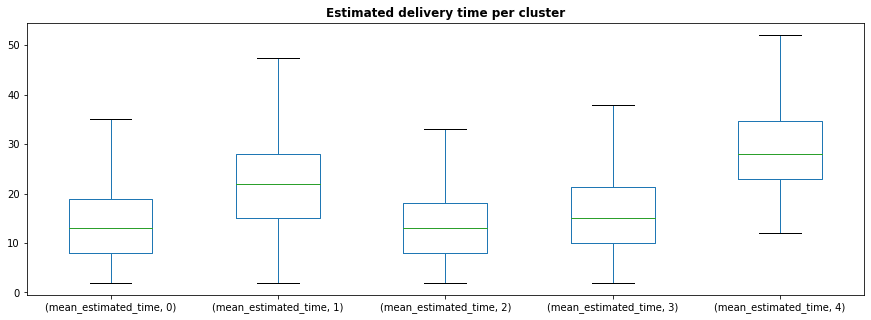

In [99]:
df_ = df_cluster_iso[['mean_estimated_time','labels']]
df_.index = range(len(df_))
df_.pivot(columns = 'labels').plot.box( figsize = (15,5), showfliers = False)
plt.title('Estimated delivery time per cluster', fontweight = 'bold')
plt.show()

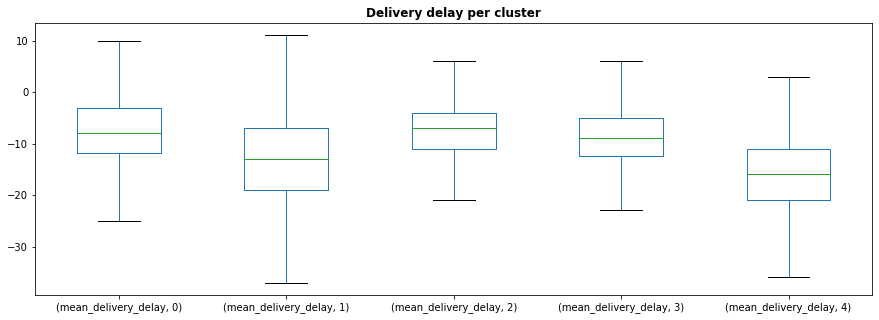

In [100]:
df_ = df_cluster_iso[['mean_delivery_delay', 'labels']]
df_.index = range(len(df_))
df_.pivot(columns = 'labels').plot.box( figsize = (15,5), showfliers = False)
plt.title('Delivery delay per cluster', fontweight = 'bold')
plt.show()

### Reviews

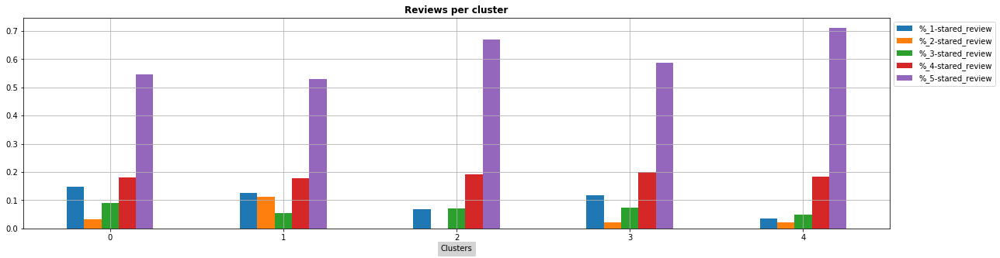

In [101]:
# Clusters by review
c_reviews = df_cluster_iso.columns[48:53]
plot_cluster_descr(df_cluster_iso, c_reviews, 'labels', title = 'Reviews per cluster')

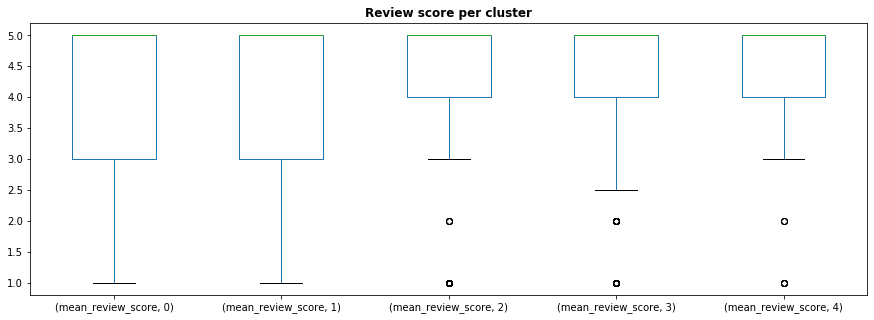

In [102]:
df_ = df_cluster_iso[['mean_review_score', 'labels']]
df_.index = range(len(df_))
df_.pivot(columns = 'labels').plot.box( figsize = (15,5), showfliers = True)
plt.title('Review score per cluster', fontweight = 'bold')
plt.show()

### Payment types

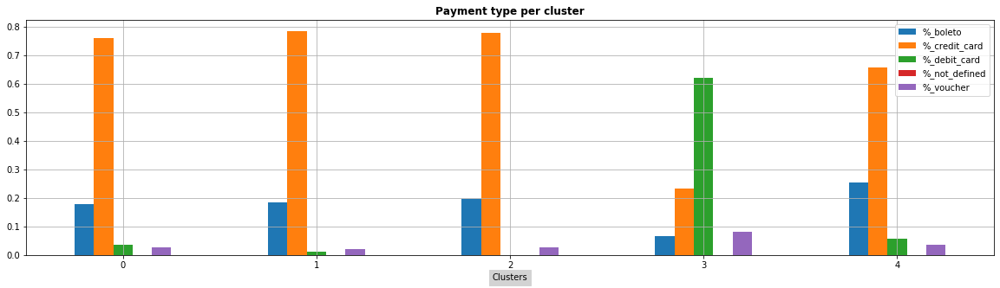

In [104]:
# Clusters by products
c_payment_type = df_cluster_iso.columns[38:43]
plot_cluster_descr(df_cluster_iso, c_payment_type, 'labels', title = 'Payment type per cluster')

### Products & prices

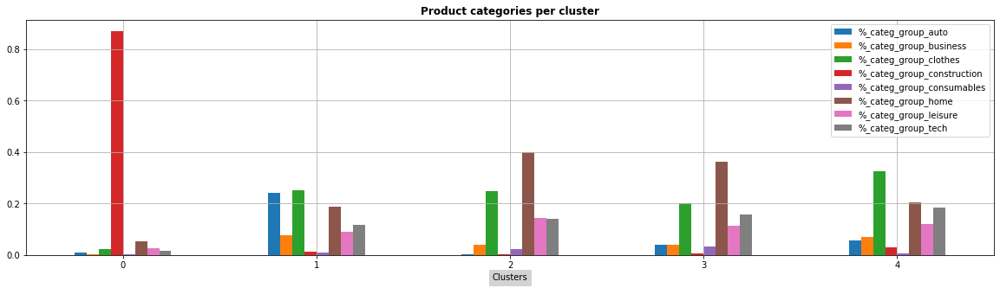

In [105]:
# Clusters by products
c_products = df_cluster_iso.columns[64:-1]
plot_cluster_descr(df_cluster_iso, c_products, 'labels', title = 'Product categories per cluster')

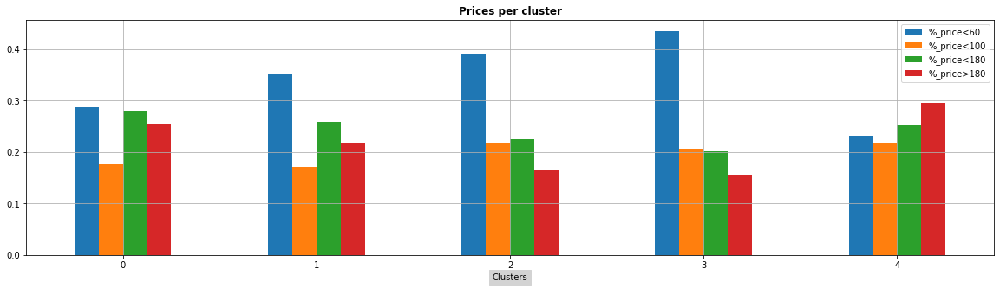

In [106]:
# Clusters by price
c_prices = df_cluster_iso.columns[33:37]
plot_cluster_descr(df_cluster_iso, c_prices, 'labels', title = 'Prices per cluster')

## Radar charts

In [134]:
# Creating a dataset of radar charts
radar_crit = ['%_delivered', '%_canceled', 'mean_cust_sell_distance', 'is_Region_Southeast',
              'is_Region_North','mean_delivery_time', 'mean_estimated_time', 
              '%_1-stared_review', '%_5-stared_review', 'mean_price', 
              '%_credit_card','labels']

df_radar = df_cluster_iso[radar_crit].groupby('labels').mean()
df_radar=df_radar/df_radar.max()

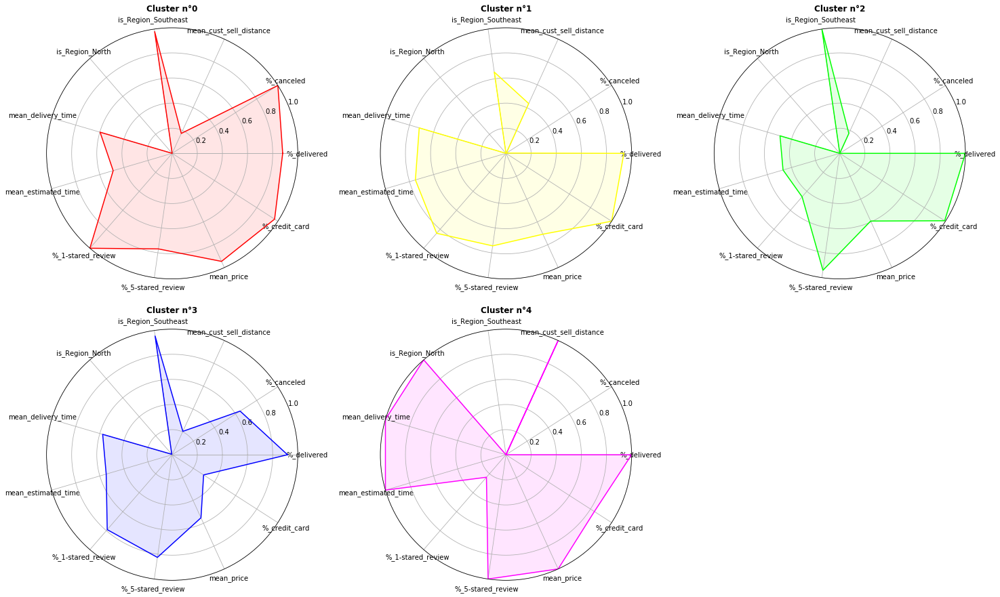

In [135]:
# Plotting radar charts
plt.figure(figsize = (25,15))

from math import pi
N = df_radar.shape[1]
angles = [n/float(N)*2*pi for n in range(N)]
angles += angles[:1]

for clt in range(5):
    values=df_radar.loc[clt].values.flatten().tolist()
    values += values[:1]
    ax = plt.subplot(2,3,1+clt, polar = True)
    plt.xticks(angles, df_radar.columns)
    ax.plot(angles, values, c_colors[clt])
    ax.fill(angles, values, c_colors[clt], alpha = 0.1)
    plt.ylim(0,1)
    plt.title('Cluster n°{}'.format(clt), fontweight = 'bold')
    
plt.show()

# DBSCAN / OPTICS

## Optimal value for eps

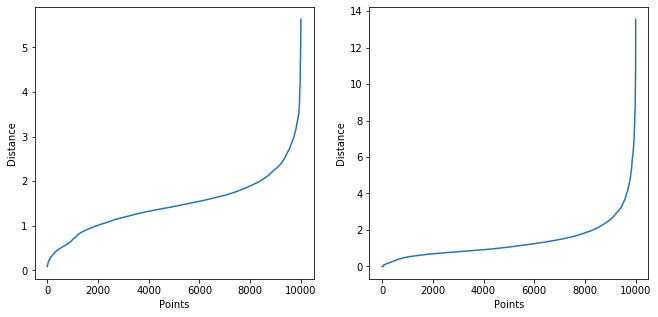

In [165]:
from sklearn.neighbors import NearestNeighbors
nearest_neighbors = NearestNeighbors(n_neighbors=11)
i=0
plt.figure(figsize = (11,5))

for dataset in [data_tsne, data_iso]:
    neighbors = nearest_neighbors.fit(dataset)
    distances, indices = neighbors.kneighbors(dataset)
    distances = np.sort(distances[:,10], axis=0)

    i+=1
    plt.subplot(1,2,i)
    plt.plot(distances)
    plt.xlabel("Points")
    plt.ylabel("Distance")
    
plt.show()

## Training OPTICS

In [166]:
from sklearn.cluster import OPTICS

opt = OPTICS(eps = 2, min_samples = 10)
opt.fit(data_tsne)
len(np.unique(opt.labels_))

298

In [168]:
opt = OPTICS(eps = 5, min_samples = 10)
opt.fit(data_iso)
len(np.unique(opt.labels_))

139

## Training DBSCAN

In [146]:
from sklearn.cluster import DBSCAN
dbs = DBSCAN(eps = 5, min_samples = 10)
dbs.fit(data_tsne)

np.unique(dbs.labels_)

array([0, 1, 2, 3, 4, 5, 6, 7], dtype=int64)

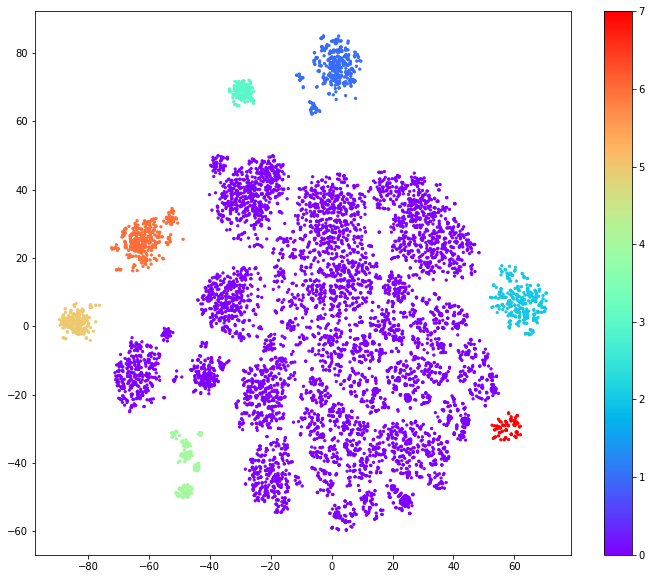

In [148]:
# Visualization
plt.figure(figsize = (12,10)) 
plt.scatter(
    data_tsne[:,0], data_tsne[:,1],
    s = 5,
    c = dbs.labels_,
    cmap = 'rainbow'
)
plt.colorbar()
plt.show()

In [175]:
from sklearn.cluster import DBSCAN
dbs = DBSCAN(eps = 5, min_samples = 10)
dbs.fit(data_iso)

np.unique(dbs.labels_)

array([-1,  0,  1,  2,  3,  4,  5], dtype=int64)

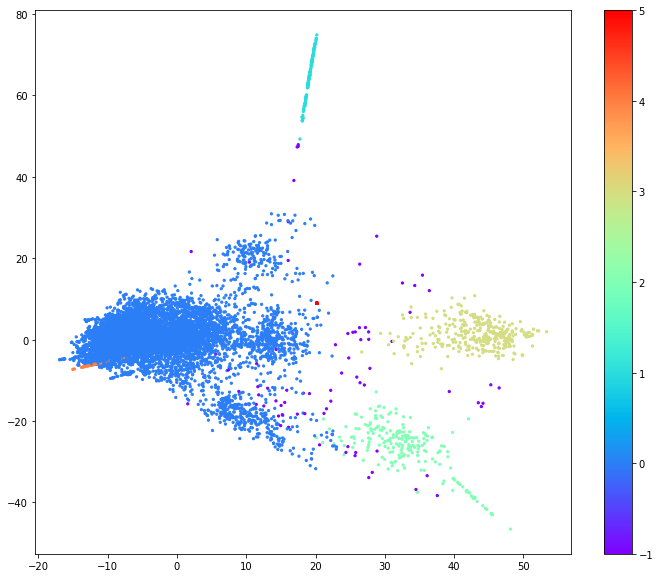

In [176]:
# Visualization
plt.figure(figsize = (12,10)) 
plt.scatter(
    data_iso[:,0], data_iso[:,1],
    s = 5,
    c = dbs.labels_,
    cmap = 'rainbow'
)
plt.colorbar()
plt.show()

# Spectral Clustering

## On TSNE

In [149]:
from sklearn.cluster import SpectralClustering

# Training for 2 to 20 clusters
silhouettes = []

for n_clts in range(2,21,2):
    print('Training with {} clusters'.format(n_clts))
    
    # Training
    spectr = SpectralClustering(n_clusters = n_clts, affinity='nearest_neighbors')
    spectr.fit(data_tsne)
    
    # Scores
    print('Calculate silhouette score')
    sil = silhouette_score(data_tsne, spectr.labels_)
    silhouettes.append(sil)

Training with 2 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 4 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 6 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 8 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 10 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 12 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 14 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 16 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 18 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 20 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score


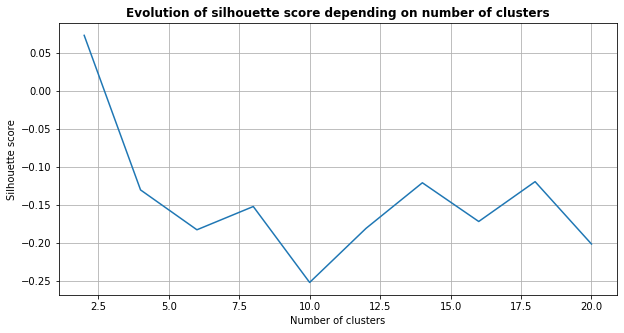

In [150]:
# Visualisation of inertia depending on the number of clusters
plt.figure(figsize = (10,5))
plt.plot(range(2,21,2), silhouettes)

plt.title('Evolution of silhouette score depending on number of clusters',fontweight = 'bold')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.grid(True)

plt.show()

C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


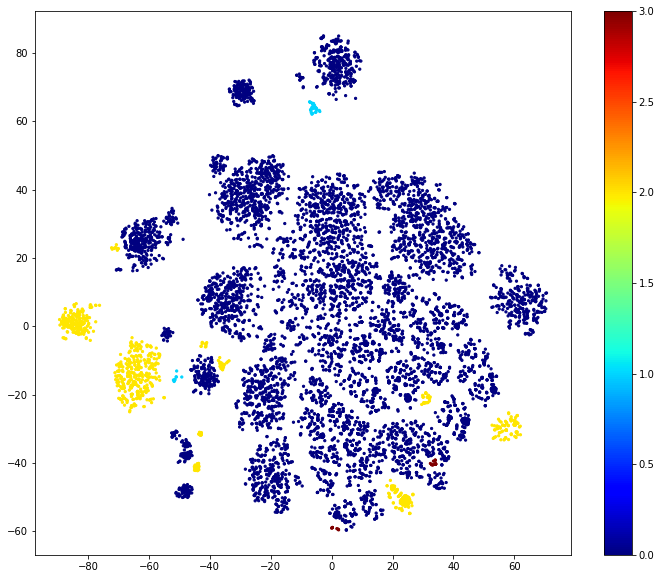

In [151]:
spectr = SpectralClustering(n_clusters = 4, affinity='nearest_neighbors')
spectr.fit(data_tsne)

# Visualization
plt.figure(figsize = (12,10)) 
plt.scatter(
    data_tsne[:,0], data_tsne[:,1],
    s = 5,
    c = spectr.labels_,
    cmap = 'jet'
)
plt.colorbar()
plt.show()

## On isomap

In [177]:
# Training for 2 to 10 clusters
silhouettes = []

for n_clts in range(2,11,1):
    print('Training with {} clusters'.format(n_clts))
    
    # Training
    spectr = SpectralClustering(n_clusters = n_clts, affinity='nearest_neighbors')
    spectr.fit(data_iso)
    
    # Scores
    print('Calculate silhouette score')
    sil = silhouette_score(data_iso, spectr.labels_)
    silhouettes.append(sil)

Training with 2 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 3 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 4 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 5 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 6 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 7 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 8 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 9 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score
Training with 10 clusters


C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


Calculate silhouette score


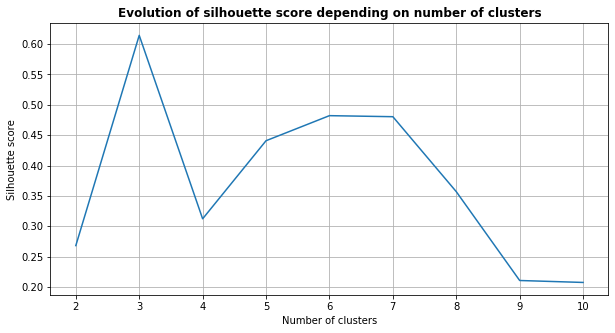

In [179]:
# Visualisation of inertia depending on the number of clusters
plt.figure(figsize = (10,5))
plt.plot(range(2,11,1), silhouettes)

plt.title('Evolution of silhouette score depending on number of clusters',fontweight = 'bold')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette score')
plt.grid(True)

plt.show()

C:\Users\alexa_000\Anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:236: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn("Graph is not fully connected, spectral embedding"


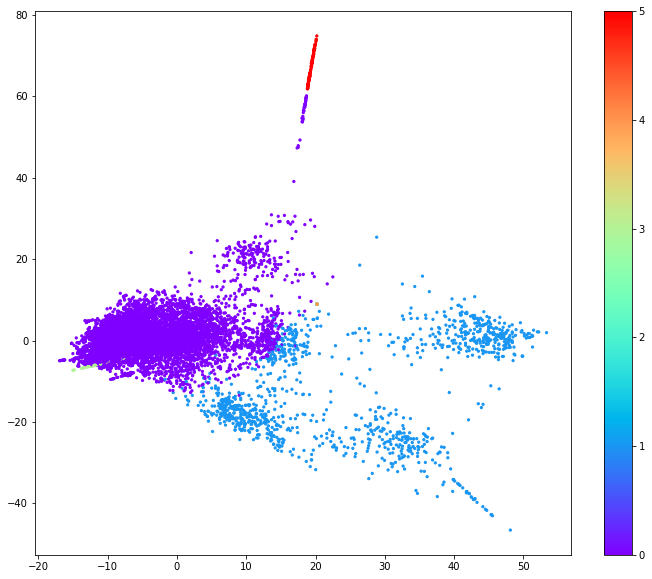

In [183]:
spectr = SpectralClustering(n_clusters = 6, affinity='nearest_neighbors')
spectr.fit(data_iso)

# Visualization
plt.figure(figsize = (12,10)) 
plt.scatter(
    data_iso[:,0], data_iso[:,1],
    s = 5,
    c = spectr.labels_,
    cmap = 'rainbow'
)
plt.colorbar()
plt.show()

# Birch

## Tuning n_clusters and threshold

In [152]:
from sklearn.cluster import Birch

# Training with K-means for 3 to 10 clusters
df_sil = pd.DataFrame(
    index = np.arange(0.1, 0.6, 0.1),
    columns = range(3,11,1)
)

for clt in range(3,11,1):
    print('Training with {} clusters'.format(clt))
    for thres in np.arange(0.1, 0.6, 0.1):
        # Training
        birch = Birch(n_clusters = clt, threshold = thres)
        birch.fit(data_tsne)

        # Scores
        sil = silhouette_score(data_tsne, birch.labels_)
        df_sil.loc[thres,clt] = sil

Training with 3 clusters
Training with 4 clusters
Training with 5 clusters
Training with 6 clusters
Training with 7 clusters
Training with 8 clusters
Training with 9 clusters
Training with 10 clusters


In [153]:
df_sil

,3,4,5,6,7,8,9,10
0.1,0.33802,0.333509,0.354893,0.342861,0.350233,0.361641,0.370505,0.377683
0.2,0.325853,0.313989,0.330753,0.349261,0.344813,0.346884,0.361787,0.373763
0.3,0.387594,0.352829,0.338329,0.333477,0.336482,0.345742,0.360607,0.383339
0.4,0.393529,0.356805,0.342687,0.347233,0.349544,0.360197,0.376509,0.388839
0.5,0.322711,0.316376,0.346486,0.344733,0.348354,0.345792,0.351022,0.361727


In [156]:
df_sil.values.max()

0.39352867

## Training with optimal hyper-parameters

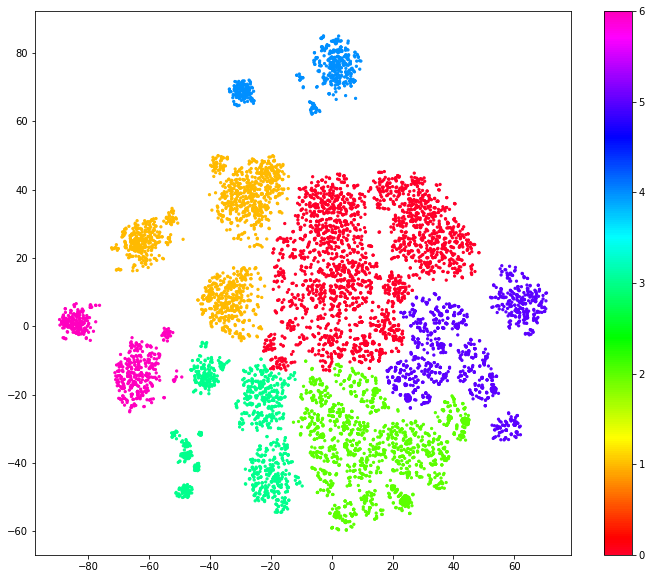

In [184]:
birch = Birch(n_clusters = 7, threshold = 0.1)
birch.fit(data_tsne)

# Visualization
plt.figure(figsize = (12,10)) 
plt.scatter(
    data_tsne[:,0], data_tsne[:,1],
    c = birch.labels_, s = 5,
    cmap = 'gist_rainbow'
)
plt.colorbar()
plt.show()

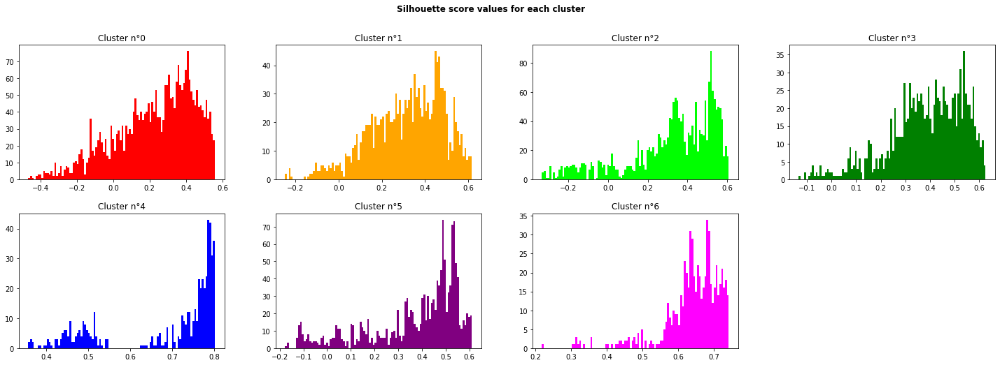

In [185]:
# Silhouette score values for each cluster
sample_silhouette_values = silhouette_samples(data_tsne, birch.labels_)

plt.figure(figsize = (25,8))
plt.suptitle('Silhouette score values for each cluster', fontweight = 'bold')
plt.subplots_adjust(wspace=0.25, hspace = 0.25)

c_colors = ['red', 'orange', 'lime', 'green',
            'blue', 'purple', 'magenta']

for i in range(7):
    plt.subplot(2,4,i+1)
    ith_cluster_silhouette_values = sample_silhouette_values[birch.labels_ == i]
    plt.hist(ith_cluster_silhouette_values, bins = 100, cumulative = False, color = c_colors[i])
    plt.title('Cluster n°{}'.format(i))
    
plt.show()

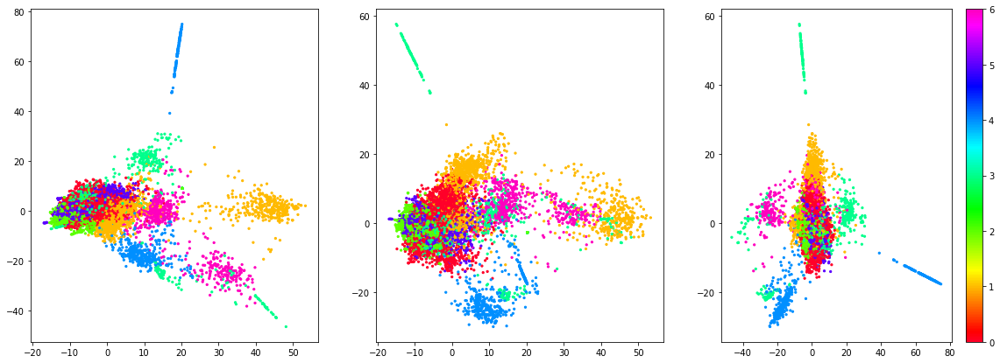

In [261]:
# Projection on the isomap
plt.figure(figsize = (20,7)) 
plt.subplot(131)
plt.scatter(data_iso[:,0], data_iso[:,1],c = birch.labels_, s = 5,cmap = 'gist_rainbow')
plt.subplot(132)
plt.scatter(data_iso[:,0], data_iso[:,2],c = birch.labels_, s = 5,cmap = 'gist_rainbow')
plt.subplot(133)
plt.scatter(data_iso[:,1], data_iso[:,2],c = birch.labels_, s = 5,cmap = 'gist_rainbow')
plt.colorbar()
plt.show()

## Cluster descriptions

In [189]:
# Anova dataset
df_clusters_tsne = df_cluster_iso.copy()
df_clusters_tsne['labels'] = birch.labels_

df_anova_birch =(df_clusters_tsne.groupby(by = 'labels').mean()/df_clusters_tsne.mean()).T

In [190]:
df_anova_birch

labels,0,1,2,3,4,5,6
%_1-stared_review,0.618314,0.849531,0.000000,5.389095,0.693143,0.024284,0.725195
%_2-stared_review,0.020779,0.715511,0.000000,6.830488,1.055520,0.000000,0.766429
%_3-stared_review,0.536449,0.930778,0.000000,4.843660,1.187113,0.262143,0.913663
%_4-stared_review,0.846476,1.148041,2.032081,0.046310,1.022120,0.396660,1.124640
%_5-stared_review,1.188784,0.995576,0.977784,0.029035,1.012299,1.434245,1.019143
...,...,...,...,...,...,...,...
mean_review_has_title,0.922104,1.126635,0.845283,1.392827,1.106564,0.881810,0.999296
mean_review_score,1.070634,1.013088,1.085524,0.457089,1.016630,1.147561,1.023518
nb_of_orders,0.975229,0.980476,0.975229,0.994802,0.980647,0.975229,1.316870
payment_installments,1.174760,0.967953,0.697938,0.970264,1.146058,1.128275,0.913349


## Radar Charts

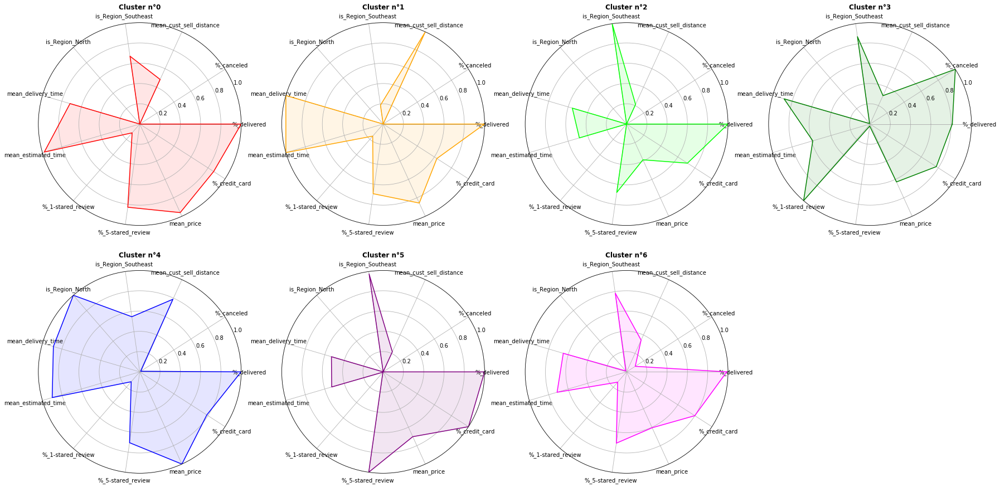

In [193]:
radar_crit2 = ['%_delivered', '%_canceled', 'mean_cust_sell_distance', 'is_Region_Southeast',
              'is_Region_North','mean_delivery_time', 'mean_estimated_time', 
              '%_1-stared_review', '%_5-stared_review', 'mean_price', 
              '%_credit_card','labels']

df_radar_2 = df_clusters_tsne[radar_crit2].groupby('labels').mean()
df_radar_2 = df_radar_2/df_radar_2.max()


# Plotting radar charts
plt.figure(figsize = (30,15))

from math import pi
N = df_radar_2.shape[1]
angles = [n/float(N)*2*pi for n in range(N)]
angles += angles[:1]

for clt in range(7):
    values=df_radar_2.loc[clt].values.flatten().tolist()
    values += values[:1]
    
    ax = plt.subplot(2,4,1+clt, polar = True)
    plt.xticks(angles, df_radar_2.columns)
    ax.plot(angles, values, c_colors[clt])
    ax.fill(angles, values, c_colors[clt], alpha = 0.1)
    plt.ylim(0,1)
    plt.title('Cluster n°{}'.format(clt), fontweight = 'bold')
    
plt.show()

# Robustness over time

## Time range

In [194]:
# Total time range
data['order_purchase_timestamp'].describe()

count                   96089
unique                  95827
top       2018-08-02 12:06:09
freq                        3
first     2016-09-04 21:15:19
last      2018-10-17 17:30:18
Name: order_purchase_timestamp, dtype: object

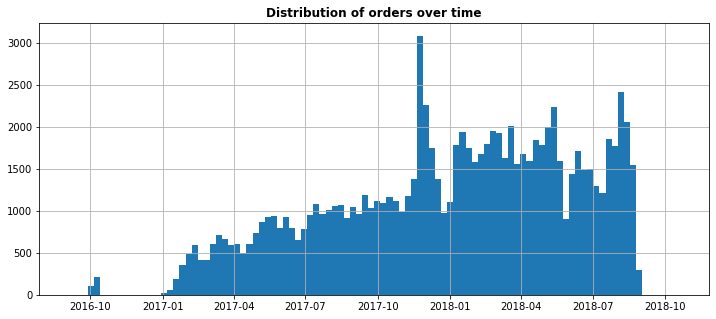

In [195]:
# Distribution of orders over time
data['order_purchase_timestamp'].hist(figsize = (12,5), bins = 100)
plt.title('Distribution of orders over time', fontweight = 'bold')
plt.show()

In [196]:
data = data.sort_values(by = 'order_purchase_timestamp')
data['date-code'] = data['order_purchase_timestamp'].apply(lambda x: str(x)[:7])

In [197]:
data['date-code'].value_counts()

2017-11    7291
2018-01    7014
2018-03    6982
2018-04    6752
2018-05    6697
2018-02    6452
2018-08    6352
2018-07    6114
2018-06    6008
2017-12    5491
2017-10    4466
2017-08    4149
2017-09    4099
2017-07    3873
2017-05    3529
2017-06    3105
2017-03    2591
2017-04    2316
2017-02    1730
2017-01     750
2016-10     315
2018-09       9
2016-09       3
2018-10       1
Name: date-code, dtype: int64

In [202]:
# Filter month with too few data
s_ = data['date-code'].value_counts().index[:-4].tolist()
s_.sort()
data_time = data[data['date-code'].isin(s_)].copy()

## Tracking centroids trajectory

In [203]:
# Initial cluster centers (with random sampling)
kmeans.cluster_centers_

array([[ 10.40136434, -18.1601075 , -22.36238001],
       [  6.29738435,   2.60890755,   9.47587426],
       [ -6.27738672,  -0.14337847,  -1.31324028],
       [ 38.73820223,  -9.60047952,   2.47455011],
       [ 19.11980673,  64.45907821, -14.98295148]])

In [204]:
# Dataset with coordinates of each centroid over time
df_traj_0 = pd.DataFrame(columns = ['x', 'y', 'z'])
df_traj_1 = pd.DataFrame(columns = ['x', 'y', 'z'])
df_traj_2 = pd.DataFrame(columns = ['x', 'y', 'z'])
df_traj_3 = pd.DataFrame(columns = ['x', 'y', 'z'])
df_traj_4 = pd.DataFrame(columns = ['x', 'y', 'z'])

In [209]:
# Initialize kmeans
kmeans_time = KMeans(n_clusters = 5, init = kmeans.cluster_centers_, n_init = 1)

# Training for each month from 2017-01 to 2018-08
for month in s_:
    
    # Selecting data for choosen month
    df_month = data_time[data_time['date-code'] == month].copy()
    df_month.drop(columns = ['order_purchase_timestamp', 'date-code'], inplace = True)
    
    # Transform to isomap and perform clustering
    df_pca_month = pca.transform(df_month)
    data_iso_month = iso.transform(df_pca_month)
    
    print('Training for month {}'.format(month))
    kmeans_time.fit(data_iso_month)
    
    # Storing coordinates of the centroids
    df_traj_0.loc[month] = kmeans_time.cluster_centers_[0]
    df_traj_1.loc[month] = kmeans_time.cluster_centers_[1]
    df_traj_2.loc[month] = kmeans_time.cluster_centers_[2]
    df_traj_3.loc[month] = kmeans_time.cluster_centers_[3]
    df_traj_4.loc[month] = kmeans_time.cluster_centers_[4]   

Training for month 2017-01
Training for month 2017-02
Training for month 2017-03
Training for month 2017-04
Training for month 2017-05
Training for month 2017-06
Training for month 2017-07
Training for month 2017-08
Training for month 2017-09
Training for month 2017-10
Training for month 2017-11
Training for month 2017-12
Training for month 2018-01
Training for month 2018-02
Training for month 2018-03
Training for month 2018-04
Training for month 2018-05
Training for month 2018-06
Training for month 2018-07
Training for month 2018-08


No handles with labels found to put in legend.


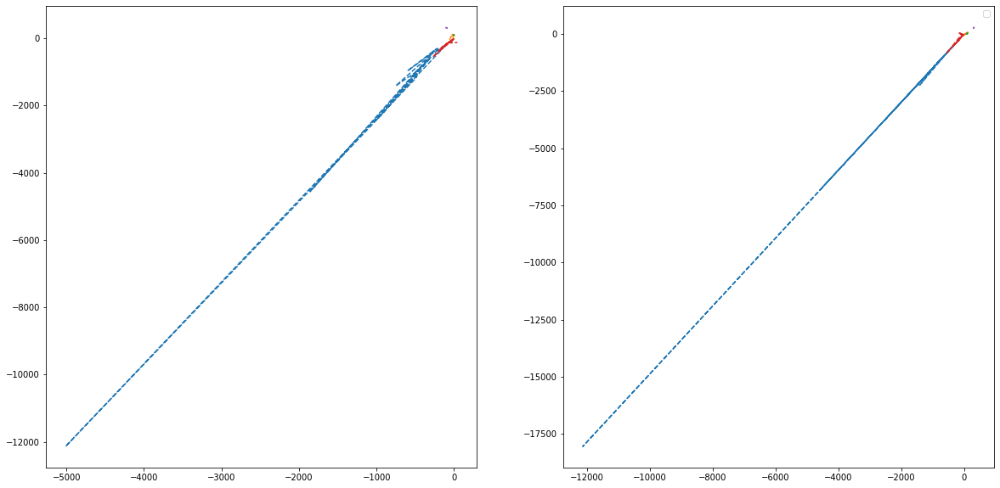

In [210]:
# Plotting trajectory of centroïds through time
plt.figure(figsize = (20,10))
plt.subplot(121)
for df_ in [df_traj_0, df_traj_1, df_traj_2, df_traj_3, df_traj_4]:
    plt.plot(df_['x'], df_['y'], linestyle = 'dashed')
    
plt.subplot(122)
for df_ in [df_traj_0, df_traj_1, df_traj_2, df_traj_3, df_traj_4]:
    plt.plot(df_['y'], df_['z'], linestyle = 'dashed')
    
plt.show()

## Quality of prediction

In [221]:
# Creating a dataset containing mean silhouette values
df_sils = pd.DataFrame(index = s_, columns = np.unique(kmeans.labels_))

In [223]:
# Predicting with kmeans model for each month from 2017-01 to 2018-08
for month in s_:
    
    # Selecting data for choosen month
    df_month = data_time[data_time['date-code'] == month].copy()
    df_month.drop(columns = ['order_purchase_timestamp', 'date-code'], inplace = True)
    
    # Transform to isomap and perform clustering
    df_pca_month = pca.transform(df_month)
    data_iso_month = iso.transform(df_pca_month)
    print('Prediction for month {}'.format(month))
    predictions = kmeans.predict(data_iso_month)
    
    # Calculate silhouette score for each cluster
    sample_silhouette_values = silhouette_samples(data_iso_month, predictions)
    for i in np.unique(kmeans.labels_):
        ith_cluster_silhouette_values = sample_silhouette_values[predictions == i]
        df_sils.loc[month, i] = ith_cluster_silhouette_values.mean()

prediction for month 2017-01
prediction for month 2017-02
prediction for month 2017-03
prediction for month 2017-04
prediction for month 2017-05
prediction for month 2017-06
prediction for month 2017-07
prediction for month 2017-08
prediction for month 2017-09
prediction for month 2017-10
prediction for month 2017-11
prediction for month 2017-12
prediction for month 2018-01
prediction for month 2018-02
prediction for month 2018-03
prediction for month 2018-04
prediction for month 2018-05
prediction for month 2018-06
prediction for month 2018-07
prediction for month 2018-08


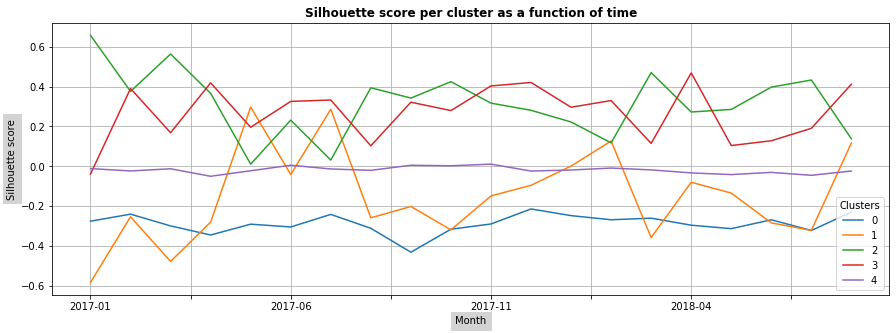

In [235]:
df_sils.plot(figsize = (15,5))
plt.xlabel('Month', backgroundcolor = 'lightgrey')
plt.ylabel('Silhouette score', backgroundcolor = 'lightgrey')
plt.title('Silhouette score per cluster as a function of time', fontweight = 'bold')
plt.grid(True)
plt.legend(loc = 'lower right', title = 'Clusters')
plt.show()

## Best number of clusters per month

In [241]:
# Creating a dataset containing silhouette values for given number of clusters per month
df_nclust = pd.DataFrame(index = s_, columns = np.arange(2,11,1))

In [242]:
# Predicting with kmeans model for each month from 2017-01 to 2018-08
for month in s_:
    
    # Selecting data for choosen month
    df_month = data_time[data_time['date-code'] == month].copy()
    df_month.drop(columns = ['order_purchase_timestamp', 'date-code'], inplace = True)
    
    # Transform to isomap and perform clustering
    df_pca_month = pca.transform(df_month)
    data_iso_month = iso.transform(df_pca_month)
    print('n_clusters for month {}'.format(month))

    for n_clts in range(2,11):
        # Training
        kmeans_month = KMeans(n_clusters = n_clts)
        kmeans_month.fit(data_iso)

        # Scores
        sil = silhouette_score(data_iso, kmeans_month.labels_)
        df_nclust.loc[month, n_clts] = sil

n_clusters for month 2017-01
n_clusters for month 2017-02
n_clusters for month 2017-03
n_clusters for month 2017-04
n_clusters for month 2017-05
n_clusters for month 2017-06
n_clusters for month 2017-07
n_clusters for month 2017-08
n_clusters for month 2017-09
n_clusters for month 2017-10
n_clusters for month 2017-11
n_clusters for month 2017-12
n_clusters for month 2018-01
n_clusters for month 2018-02
n_clusters for month 2018-03
n_clusters for month 2018-04
n_clusters for month 2018-05
n_clusters for month 2018-06
n_clusters for month 2018-07
n_clusters for month 2018-08


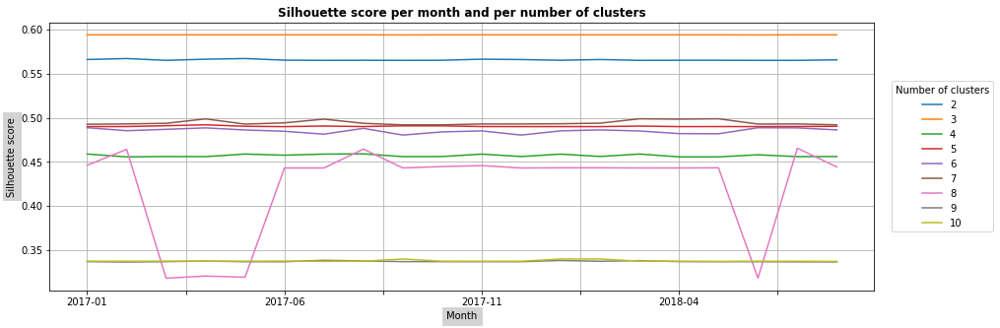

In [254]:
df_nclust.plot(figsize = (15,5))
plt.xlabel('Month', backgroundcolor = 'lightgrey')
plt.ylabel('Silhouette score', backgroundcolor = 'lightgrey')
plt.title('Silhouette score per month and per number of clusters', fontweight = 'bold')
plt.grid(True)
plt.legend(title = 'Number of clusters', bbox_to_anchor=(0,0,1.15,0.8))
plt.show()